# Covid Visualization
# Devbrat Anuragi
## 17078
### EECS

In this project i have plotted several graph related to covid trends all over the world.
Click on the following link to directly move to each plots
- John hopkin's data
  - [Confirmed case vs Latitude/longitude](#jh_lat) : It's a static scatter plot. Since the population is unevenly distributed around the world. there is no relation to the covid cases with latitude or longitude
  - [Dynamic Heat map](#jh_dy) : This is a dynamic map i.e. you can drag in/out of the map and click on marker to get details. Also on the top right corner of the map, there is a layer symbol, you can choose different options from there too.
- World Info data
  - [Dynamic Heat Map](#w_dy) : This same as the previous map only in this map i Have used the data to WorldOMeter
- Exploring another Covid Library
  - [Dynamic line plot to see covid past trend](#l_api) : In this map ou will find a date range slider, From there You can choose the date and the Line plot will show o the total deaths/confirmed/recovered cases in India 
  - Covid Trend in India
    - [Confirmed Cases per day](#c_i)
    - [Deaths Per day](#d_i)
    - [Recovered Per day](#r_i)
  - [Dynamic WorldWide covid trend on Map](#d_w) : This one is a time series map. By use of slider yo can see the deaths due to corona all around the world on the map.
  - [Trend between two dates](#t_b) : This is the bar plot. It lets you to choose two things, first a range of dates, second type of covid case (confirmed/deaths/ death per day....). Once you have chossen that It sort the data in decending order, so that the bar plot of country with highest number of, let's say confirmed cases, always remains on the top
  - [Animation](#a) : Created Video was very large in size, So I have stored it in the drive please have a look over [here](https://drive.google.com/drive/folders/1ct7mcWwUKVsVbAKtbokWeqZtL3YWhpQX?usp=sharing)
  - [See trend in any country](#t)


In [1]:
!pip install branca
!pip install covid
!pip install jupyterthemes
!pip install mplcursors
#!pip install covid-data-api
!pip install geopandas
!pip install countryinfo 
!pip install folium -U

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 10.1 MB 8.5 MB/s 
  Created wheel for covid: filename=covid-2.5.1-py3-none-any.whl size=10422 sha256=ec1e1a1ac21a5e6ccfbc2a8fb0a84f3067a23d180ed45f3a0eedeb962d0687dc
  Stored in directory: /root/.cache/pip/wheels/66/5b/82/ac8559b5b11f9ab8397af9187c9f944bebb192d157e67ec1a1
Successfully built covid
     |████████████████████████████████| 7.0 MB 4.7 MB/s 
     |████████████████████████████████| 46 kB 4.0 MB/s 
     |████████████████████████████████| 9.9 MB 37.6 MB/s 
     |████████████████████████████████| 49 kB 5.7 MB/s 
     |████████████████████████████████| 428 kB 38.7 MB/s 
  Attempting uninstall: tornado
    Found existing installation: tornado 5.1.1
    Uninstalling tornado-5.1.1:
      Successfully uninstalled tornado-5.1.1
  Attempting uninstall: notebook
    Found existing installation: notebook 5.3.1
    Uninstalli

     |████████████████████████████████| 86 kB 3.3 MB/s 
  Created wheel for mplcursors: filename=mplcursors-0.4-py3-none-any.whl size=19985 sha256=7188f1c71d0343f44b8850ca3e4aa3353808d5cf7bc881edf86639fe81762821
  Stored in directory: /root/.cache/pip/wheels/09/8a/90/32b30a664f7c3c4b0062f2cc5593696d1d82e758dc54d5cc1f
Successfully built mplcursors
     |████████████████████████████████| 1.0 MB 5.4 MB/s 
     |████████████████████████████████| 6.3 MB 35.6 MB/s 
     |████████████████████████████████| 15.4 MB 41 kB/s 
     |████████████████████████████████| 602 kB 5.3 MB/s 
     |████████████████████████████████| 94 kB 2.2 MB/s 
  Attempting uninstall: folium
    Found existing installation: folium 0.8.3
    Uninstalling folium-0.8.3:
      Successfully uninstalled folium-0.8.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datascience 0.10.6 requires folium==0.2

In [2]:
from glob import glob
import numpy as np
import folium
from folium import plugins
from folium.plugins import HeatMap
import pandas as pd
from covid import Covid
import requests
import urllib.parse
#%pylab inline
from jupyterthemes import jtplot

jtplot.style("onedork")
#%matplotlib widget
import mplcursors
#from covid.api import CovId19Data
import yaml
from ipywidgets import interact, interactive, fixed, interact_manual
#import ipywidgets as widgets
import matplotlib.pyplot as plt, random
import seaborn as sns
from countryinfo import CountryInfo

In [3]:


# by default data source is "john_hopkins"
covid = Covid()


covid_j = Covid(source="john_hopkins")

# to get data from worldometers.info
covid_w = Covid(source="worldometers")

<a name='jh'></a>
## John's Hopkins Data

In [4]:
#creating dataframe 
df_j = pd.DataFrame(covid_j.get_data())

# droping row that does not contain any number
df_j = df_j.dropna(subset=['latitude','longitude', 'country'])

#converting unix time to human readable format
df_j['date'] = pd.to_datetime(df_j['last_update'],unit='ms')
df_j.head()

,id,country,confirmed,active,deaths,recovered,latitude,longitude,last_update,date
0,182,US,45924891,None,745384,None,40.000000,-100.00000,1635589335000,2021-10-30 10:22:15
1,80,India,34260470,None,457740,None,20.593684,78.96288,1635589335000,2021-10-30 10:22:15
2,24,Brazil,21793401,None,607462,None,-14.235000,-51.92530,1635589335000,2021-10-30 10:22:15
3,186,United Kingdom,9021701,None,140815,None,55.000000,-3.00000,1635589335000,2021-10-30 10:22:15
4,145,Russia,8338053,None,233063,None,61.524000,105.31880,1635589335000,2021-10-30 10:22:15


## Fetching Population of each country

### Calclation of death, confirmed cases per population of a country

In [5]:
for index, row in df_j.iterrows():
  try:
    popu = CountryInfo(row['country']).population()
    df_j.at[index,'confirmed_per_popu'] = row['confirmed']/popu
    df_j.at[index,'deaths_per_popu'] = row['deaths']/popu
    #df_j.at[index,'active_per_popu'] = row['active']/popu
  except : 
    pass
    #df_j = df_j.drop(index)
    #print(df_j.head())

In [6]:
df_j.head()

,id,country,confirmed,active,deaths,recovered,latitude,longitude,last_update,date,confirmed_per_popu,deaths_per_popu
0,182,US,45924891,None,745384,None,40.000000,-100.00000,1635589335000,2021-10-30 10:22:15,0.143848,0.002335
1,80,India,34260470,None,457740,None,20.593684,78.96288,1635589335000,2021-10-30 10:22:15,0.027106,0.000362
2,24,Brazil,21793401,None,607462,None,-14.235000,-51.92530,1635589335000,2021-10-30 10:22:15,0.107048,0.002984
3,186,United Kingdom,9021701,None,140815,None,55.000000,-3.00000,1635589335000,2021-10-30 10:22:15,0.140732,0.002197
4,145,Russia,8338053,None,233063,None,61.524000,105.31880,1635589335000,2021-10-30 10:22:15,0.057019,0.001594



<a name='jh_lat'></a>
#### Plotting 

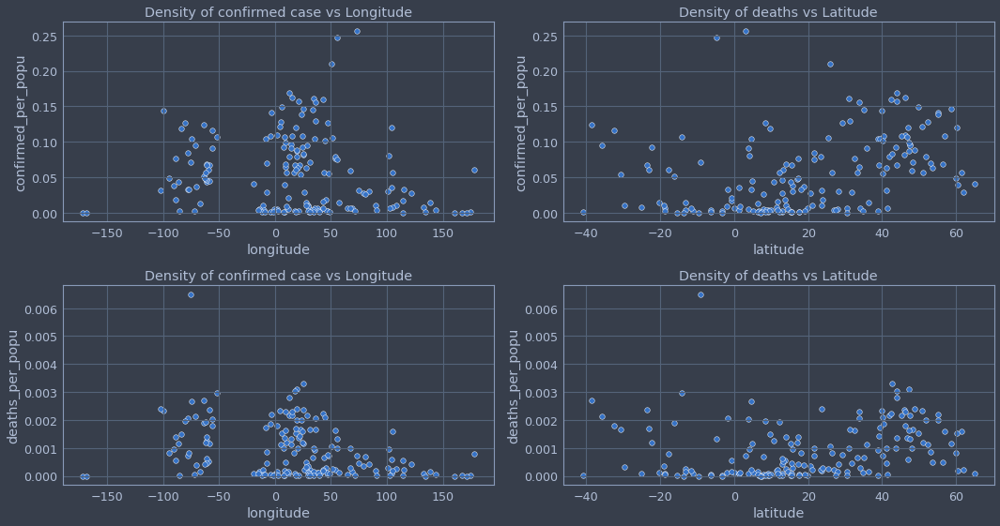

In [7]:
f, ax = plt.subplots(2, 2,figsize=(15, 8))

x = df_j['longitude']
y = df_j['latitude']
z = df_j['confirmed_per_popu']
p = df_j ['deaths_per_popu']

#sns.scatterplot(x=x, y=y, s=5, color=".15")
#sns.histplot(x=x, y=y, bins=20, pthresh=.1, cmap="Blues_r")
ax[0,0].set_title('Density of confirmed case vs Longitude')
ax[0,1].set_title('Density of deaths vs Latitude')
ax[1,0].set_title('Density of confirmed case vs Longitude')
ax[1,1].set_title('Density of deaths vs Latitude')

sns.scatterplot(x=x, y=z, ax = ax[0,0])
sns.scatterplot(x=y, y=z, ax = ax[0,1])
sns.scatterplot(x=x, y=p, ax = ax[1,0])
sns.scatterplot(x=y, y=p, ax = ax[1,1])
f.tight_layout() 

plt.show()
jtplot.style("onedork", figsize=(15,8))

## Observation
Since the population is unevenly distributed around the world there is no patter in the above plots

## Plotting data on interactive map

In [ ]:
df_total_confirmed =df_j[['latitude', 'longitude', 'confirmed']]
df_total_confirmed = df_total_confirmed.dropna()
list_total_confirmed = df_total_confirmed.values.tolist()
df_total_death =df_j[['latitude', 'longitude', 'deaths']]
df_total_death = df_total_death.dropna()
list_total_death = df_total_death.values.tolist()
df_total_active =df_j[['latitude', 'longitude', 'active']]
df_total_active = df_total_active.dropna()
list_total_active = df_total_active.values.tolist()
df_total_recovered =df_j[['latitude', 'longitude', 'recovered']]
df_total_recovered = df_total_recovered.dropna()
list_total_recovered = df_total_recovered.values.tolist()

 <a name='jh_dy'></a>
### Interactive Heat map

In [ ]:
lon, lat = -86.276, 30.935 
zoom_start = 5

m = folium.Map([20.5, 78.9], tiles='Cartodb dark_matter', zoom_start=3)

marker = folium.FeatureGroup("Marker")

mark_confirmed_case = folium.plugins.FeatureGroupSubGroup(marker, 'Confirm Case') 
mark_active_case = folium.plugins.FeatureGroupSubGroup(marker, 'Active Case')
mark_deaths_case = folium.plugins.FeatureGroupSubGroup(marker, 'Deaths Case')
mark_recovered_case = folium.plugins.FeatureGroupSubGroup(marker, 'Recovered Case') 

heat = folium.FeatureGroup("Heat map") 
heat_confirmed_case = folium.plugins.FeatureGroupSubGroup(heat, 'Confirm Case') 
heat_active_case = folium.plugins.FeatureGroupSubGroup(heat, 'Active Case')
heat_deaths_case = folium.plugins.FeatureGroupSubGroup(heat, 'Deaths Case')
heat_recovered_case = folium.plugins.FeatureGroupSubGroup(heat, 'Recovered Case') 


m.add_child(marker)

m.add_child(mark_confirmed_case)
m.add_child(mark_active_case)
m.add_child(mark_deaths_case)
m.add_child(mark_recovered_case)

m.add_child(heat)
m.add_child(heat_confirmed_case)
m.add_child(heat_active_case)
m.add_child(heat_deaths_case)
m.add_child(heat_recovered_case)

heat_confirmed_case.add_child(HeatMap(list_total_confirmed,))
heat_deaths_case.add_child(HeatMap(list_total_death, ))
heat_active_case.add_child(HeatMap(list_total_active,))
heat_recovered_case.add_child(HeatMap(list_total_recovered, ))
#HeatMap(list_total_confirmed,auto_play = True ).add_to(folium.FeatureGroup(name='Confirmed Cases Heat Map').add_to(m))
#HeatMap(list_total_death,auto_play = True ).add_to(folium.FeatureGroup(name='Total Deaths Heat Map').add_to(m))
#HeatMap(list_total_active,auto_play = True ).add_to(folium.FeatureGroup(name='Active case Heat Map').add_to(m))
#HeatMap(data2,auto_play = True ).add_to(folium.FeatureGroup(name='Heat Map2').add_to(m))

"""folium.Marker(location =[20.5, 78.9],
                            popup =
                            "Total Cases: " + ''+ '<br>' +
                            "District: " +  ''+'<br>'
                            "State: " + ''+'<br>'+
                            "Coordinates: " +'',
                            icon = folium.Icon(color ='blue')).add_to(folium.FeatureGroup(name='Total Deaths Heat Map').add_to(m))"""

for index, row in df_j.iterrows():
    marker.add_child(folium.Marker(tooltip = "Click for status of "+str(row.country),location = (row.latitude, row.longitude),
                 popup = str('<h1>'+str(row.country)+'</h1><table>  <tr>    <th>  Confirmed&nbsp; </th>    <th>&nbsp;Deaths&nbsp;</th>    <th>&nbsp;Recovered&nbsp;</th>    <th>&nbsp;Active&nbsp;</th>  </tr>  <tr> <td> '+str(row.confirmed)+ '</td><td>&nbsp;'+str(row.deaths)+'</td><td>&nbsp;'+ str(row.recovered)+'</td><td>&nbsp;'+str(row.active)+'</td></tr></table>'
                 ),icon=folium.Icon(color="green", icon="info-sign")
                                   
                                  ))

loc = 'John Hopkin\'s Data'
title_html = '''
             <h1 align="center" "><b>{}</b></h1>
             '''.format(loc)  
m.get_root().html.add_child(folium.Element(title_html))
#layer.add_to(m)
folium.LayerControl().add_to(m)

#m.add_child()

m

## Working with WorldInfo Data

In [ ]:
df_w = pd.DataFrame(covid_w.get_data())

WorldInfo data does not have the latitude and longitde, SO i have used a openstreet api to retrieve the latitude and longitde of each country

In [ ]:
for index, row in df_w.iterrows():
    
    url = 'https://nominatim.openstreetmap.org/search/' + urllib.parse.quote(row.country) +'?format=json'
    response = requests.get(url).json()
    if len(response) != 0:
        if response[0]['type'] != 'continent' and response[0]['type'] != 'archipelago':
            #print(row.country)
            #print(response[0]["lat"])
            #print(response[0]["lon"])
            df_w.at[index,'latitude'] = float(response[0]["lat"])
            df_w.at[index,'longitude'] = float(response[0]["lon"])
df_w = df_w.dropna()
df_w.head()


,country,total_cases,confirmed,new_cases,deaths,new_deaths,recovered,active,active_cases,critical,total_tests,total_tests_per_million,total_cases_per_million,total_deaths_per_million,population,latitude,longitude
7,World,246871470,246871470,143516,5006936,2934,223623310,18241224,18241224,74711,0,0,31671,642.3,0,-36.853571,174.745681
8,USA,46771979,46771979,0,765722,0,36646900,9359357,9359357,12716,697847798,0,140214,2296,333574837,39.783730,-100.445882
9,India,34260470,34260470,751,457773,0,33641175,161522,161522,8944,607062619,0,24507,327,1397976093,22.351115,78.667743
10,Brazil,21793401,21793401,0,607504,0,20986901,198996,198996,8318,63776166,0,101572,2831,214561469,-10.333333,-53.200000
11,UK,8979236,8979236,0,140392,0,7290633,1548211,1548211,946,331717146,0,131355,2054,68358613,54.702354,-3.276575


In [ ]:
def get_data(df , col):
    df_total =df[['latitude', 'longitude', col]]
    df_total = df_total.dropna()
    list_total = df_total.values.tolist()
    return list_total

<a name='w_dy'></a>
### Iteractive heat map 

In [ ]:
m = folium.Map([20.5, 78.9], tiles='Cartodb dark_matter', zoom_start=3)


marker = folium.FeatureGroup("Marker")
heat = folium.FeatureGroup("Heat map") 
m.add_child(marker)
m.add_child(heat)

heat_confirmed_case = folium.plugins.FeatureGroupSubGroup(heat, 'Confirm Case') 
heat_active_case = folium.plugins.FeatureGroupSubGroup(heat, 'Active Case')
heat_deaths_case = folium.plugins.FeatureGroupSubGroup(heat, 'Deaths Case')
heat_recovered_case = folium.plugins.FeatureGroupSubGroup(heat, 'Recovered Case') 

m.add_child(heat_confirmed_case)
m.add_child(heat_active_case)
m.add_child(heat_deaths_case)
m.add_child(heat_recovered_case)
x = get_data(df_w,'confirmed')
heat_confirmed_case.add_child(HeatMap(x ))
heat_deaths_case.add_child(HeatMap(get_data(df_w,'deaths'), ))
heat_active_case.add_child(HeatMap(get_data(df_w,'active'), ))
heat_recovered_case.add_child(HeatMap(get_data(df_w, 'recovered'), ))

for index, row in df_w.iterrows():
    marker.add_child(folium.Marker(tooltip = "Click for status of "+str(row.country),location = (row.latitude, row.longitude),
                 popup = str('<h1>'+str(row.country)+'</h1><table>  <tr>    <th>  Confirmed&nbsp; </th>    <th>&nbsp;Deaths&nbsp;</th>   <th>&nbsp;New&nbsp;Deaths&nbsp;</th>  <th>&nbsp;Recovered&nbsp;</th>    <th>&nbsp;Active&nbsp;</th> <th>&nbsp;Critical&nbsp;</th> <th>&nbsp;Tests&nbsp;</th>  </tr>  <tr> <td> '+str(row.confirmed)+ '</td><td>&nbsp;'+str(row.deaths)+'</td><td>&nbsp;'+str(row.new_deaths)+'</td><td>&nbsp;'+ str(row.recovered)+'</td><td>&nbsp;'+str(row.active)+'</td> <td>&nbsp;'+str(row.critical)+'</td>  <td>&nbsp;'+str(row.total_tests)+'</td></tr></table>'
                 ),icon=folium.Icon(color="green", icon="info-sign")
                                   
                                  ))

loc = 'WorldOmeter Data'
title_html = '''
             <h1 align="center" "><b>{}</b></h1>
             '''.format(loc)  
m.get_root().html.add_child(folium.Element(title_html))

folium.LayerControl().add_to(m)

#m.add_child()

m

## Time Series Analysis
### Using another library covid-data-api


In [8]:
!pip install covid-data-api
from covid.api import CovId19Data

     |████████████████████████████████| 227 kB 5.4 MB/s 
  Attempting uninstall: python-dateutil
    Found existing installation: python-dateutil 2.8.2
    Uninstalling python-dateutil-2.8.2:
      Successfully uninstalled python-dateutil-2.8.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires notebook~=5.3.0; python_version >= "3.0", but you have notebook 6.4.5 which is incompatible.
google-colab 1.0.0 requires tornado~=5.1.0; python_version >= "3.0", but you have tornado 6.1 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [9]:

api = CovId19Data(force=False)
res = api.get_history_by_country("India")
#print(yaml.dump(res, allow_unicode=True, default_flow_style=False))

In [10]:
#getting time series data for India

df = pd.DataFrame.from_dict(res['india']['history'])
df =df.transpose()
df.reset_index(inplace=True)
df.rename(columns={'index':'datetime'}, inplace=True)
df['datetime'] = pd.to_datetime(df['datetime'])
df.tail()

,datetime,confirmed,change_confirmed,recovered,change_recovered,deaths,change_deaths
642,2021-10-25,34202202,0.0003635005016412217,0,na,455068,0.0007829131406252749
643,2021-10-26,34215653,0.000393278771934041,0,na,455653,0.0012855221637205869
644,2021-10-27,34231809,0.00047218154801838795,0,na,456386,0.0016086802896063451
645,2021-10-28,34246157,0.0004191423246139285,0,na,457191,0.0017638577870486825
646,2021-10-29,34260470,0.00041794470544534386,0,na,457740,0.0012008110395873935


<a name='l_api'></a>
### Ploting Interactive plot 

In [16]:
from __future__ import print_function
import matplotlib
import ipywidgets as widgets
#%matplotlib widget
matplotlib.rcParams['figure.figsize'] = [15, 5]
matplotlib.rcParams['axes.labelsize'] = 20
matplotlib.rcParams['xtick.labelsize'] = 17
matplotlib.rcParams['ytick.labelsize'] = 17

def series(time, Recovered, Deaths, Confirmed ):
    
    date,confirmed,death, recovered=[],[], [],[]
    for index, row in df.iterrows():
        
        date.append(row[0])
        confirmed.append(row[1])
        recovered.append(row[3])
        death.append(row[5])
        if index == time:
            break
    if Confirmed:
        plt.plot(date,confirmed, color = 'yellow')
        plt. fill_between(date, confirmed, color = 'blue', alpha = 0.3)
    if Recovered:
        plt.plot(date, recovered, color = 'blue')
        plt. fill_between(date, recovered, color = 'green', alpha = 0.3)
    if Deaths:
        plt.plot(date, death, color = 'red')
        plt. fill_between(date, death,edgecolor="r", alpha = 0.3, animated = True, )
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.xticks(rotation=0)
    mplcursors.cursor(hover=True)
    
    plt.show()
    return()
interactive_plot = interactive(series, time=(0,len(df),10), Recovered= True, Deaths = True, Confirmed = True,)
output = interactive_plot.children[-1]

interactive_plot

interactive(children=(IntSlider(value=320, description='time', max=647, step=10), Checkbox(value=True, descrip…

In [17]:
df['deaths_per_day'] = df['deaths'].diff()
df['confirmed_cases_per_day'] = df['confirmed'].diff()
df['recovered_cases_per_day'] = df['recovered'].diff()
#df.tail()

<a name='d_i'></a>

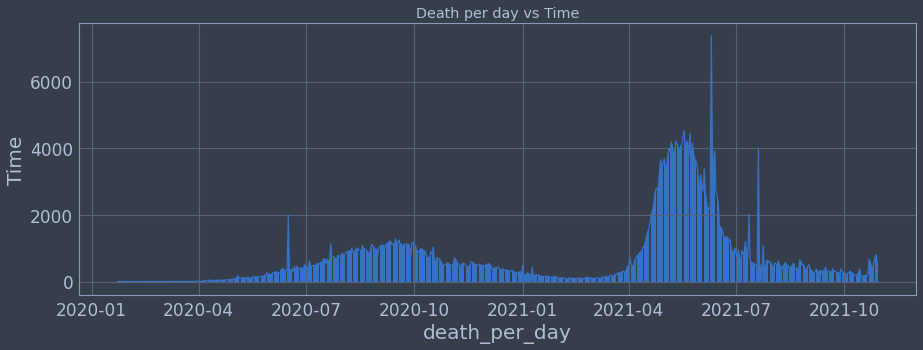

In [18]:
plt.plot(df['datetime'], df['deaths_per_day'])
plt.bar(df['datetime'], df['deaths_per_day'])
plt.xlabel('death_per_day')
plt.ylabel('Time')
plt.title('Death per day vs Time')
plt.show()

<a name='c_i'></a>

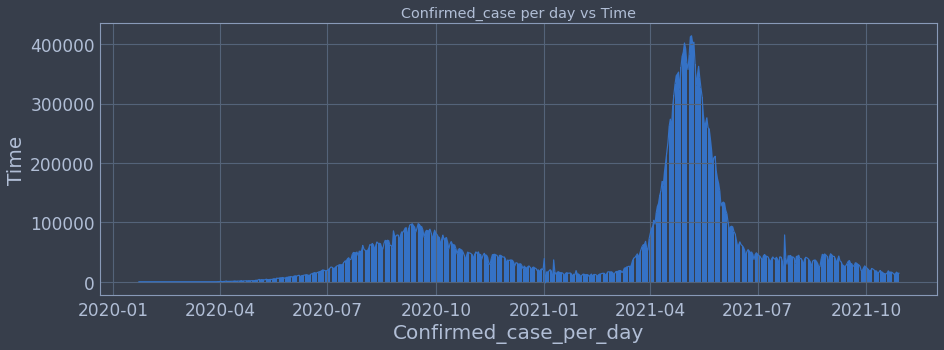

In [19]:
plt.plot(df['datetime'], df['confirmed_cases_per_day'])
plt.bar(df['datetime'], df['confirmed_cases_per_day'])
plt.xlabel('Confirmed_case_per_day')
plt.ylabel('Time')
plt.title('Confirmed_case per day vs Time')
plt.show()

<a name='r_i'></a>

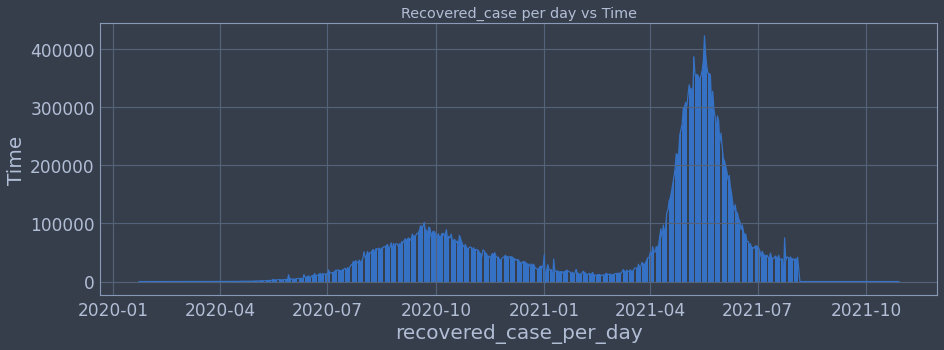

In [20]:
df =df.drop([561])
plt.plot(df['datetime'],df['recovered_cases_per_day'])
plt.bar(df['datetime'], df['recovered_cases_per_day'])
plt.xlabel('recovered_case_per_day')
plt.ylabel('Time')
plt.title('Recovered_case per day vs Time')
plt.show()

## Time Series Visalization

In [21]:
import geopandas as gpd
assert 'naturalearth_lowres' in gpd.datasets.available
datapath = gpd.datasets.get_path('naturalearth_lowres')
gdf = gpd.read_file(datapath)

In [22]:
gdf["name"]= gdf["name"].str.replace("\.", "", case = False)
gdf["name"]= gdf["name"].str.replace("\-", "", case = False)
gdf["name"]= gdf["name"].str.replace(" ", "_", case = False)
gdf["name"]= gdf["name"].str.replace("united_states_of_america", "us", case = False)
gdf['name'] = gdf['name'].str.lower()
gdf = gdf.rename(columns={'name': 'country'})
gdf.head()

,pop_est,continent,country,iso_a3,gdp_md_est,geometry
0,920938,Oceania,fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,w_sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,us,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


In [23]:
res = api.get_all_records_by_country()


#res['united_states_of_america'] = res['us']
#res.pop('us')
#print(yaml.dump(res, allow_unicode=True, default_flow_style=False))

Getting history of covid cases for all country

In [24]:
con_set1 = set(res.keys())
con_set2 = set(gdf.country)
history_df = pd.DataFrame( columns=['datetime','confirmed',	'change_confirmed',	'recovered',	'change_recovered',	'deaths',	'change_deaths', 'country'])

"""
df = pd.DataFrame.from_dict(res['india']['history'])
df =df.transpose()
df.reset_index(inplace=True)
df.rename(columns={'index':'datetime'}, inplace=True)
df['datetime'] = pd.to_datetime(df['datetime'])
df.tail(10)
"""

for country in con_set1:
  #print(country)
  if country in con_set2:
    print(country)
    try:
      history = api.get_history_by_country(country)
      #history[country]['history']['country'] = country
      temp = pd.DataFrame.from_dict(history[country]['history'])
      temp = temp.transpose()
      temp.reset_index(inplace = True)
      temp.rename(columns={'index':'datetime'}, inplace=True)
      temp['datetime'] = pd.to_datetime(temp['datetime'])
      temp['datetime_unix'] = pd.to_datetime(temp['datetime']).astype(int) / 10**9
      temp['country'] = country
      temp['deaths_per_day'] = temp['deaths'].diff()
      temp['confirmed_cases_per_day'] = temp['confirmed'].diff()
      temp['recovered_cases_per_day'] = temp['recovered'].diff()
      #print(temp)
      history_df = history_df.append(temp)
      
    except Exception as e:
      print("contry not fond ", e)

angola
russia
lesotho
guinea
uganda
burkina_faso
contry not fond  Given Country/Region not found
madagascar
jordan
mali
thailand
malawi
us
chad
paraguay
romania
pakistan
sri_lanka
contry not fond  Given Country/Region not found
greece
chile
somalia
finland
oman
belize
portugal
israel
serbia
morocco
peru
panama
ethiopia
afghanistan
senegal
rwanda
united_arab_emirates
contry not fond  Given Country/Region not found
kazakhstan
bahamas
spain
mexico
sudan
liberia
moldova
guatemala
eswatini
iran
bangladesh
belgium
haiti
honduras
albania
brazil
namibia
taiwan
papua_new_guinea
contry not fond  Given Country/Region not found
gabon
australia
brunei
qatar
france
china
japan
south_africa
contry not fond  Given Country/Region not found
mozambique
united_kingdom
contry not fond  Given Country/Region not found
lithuania
togo
belarus
guyana
ecuador
laos
czechia
hungary
nigeria
malaysia
italy
guineabissau
lebanon
new_zealand
contry not fond  Given Country/Region not found
slovenia
gambia
georgia
kyrgyz

In [25]:
sorted_history = history_df.sort_values(['country','datetime_unix'])
#sorted_history.tail()

In [26]:
joined_df = sorted_history.merge(gdf, on = 'country')
joined_df['datetime_unix'] = joined_df['datetime_unix'].astype(int).astype(str)

#joined_df.head(30)

In [27]:
import branca.colormap as cm
topic = 'confirmed_cases_per_day'
joined_df = joined_df.dropna(subset=[topic])
max_color = max(joined_df[topic])
min_color = min(joined_df[topic])
cmap = cm.linear.PuBu_08.scale(min_color, max_color)
joined_df['color'] = joined_df[topic].map(cmap)

In [28]:
country_list = joined_df['country'].unique().tolist()
country_idx = range(len(country_list))
style_dict = {}
for i in country_idx:
    country = country_list[i]
    result = joined_df[joined_df['country'] == country]
    inner_dict = {}
    for _, r in result.iterrows():
        inner_dict[r['datetime_unix']] = {'color': r['color'], 'opacity': 0.8}
    style_dict[str(i)] = inner_dict

In [29]:
countries_df = joined_df[['geometry']]
countries_gdf = gpd.GeoDataFrame(countries_df)
countries_gdf = countries_gdf.drop_duplicates().reset_index()


In [30]:
countries_gdf.head()

,index,geometry
0,1,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."
1,648,"POLYGON ((21.02004 40.84273, 20.99999 40.58000..."
2,1295,"POLYGON ((-8.68440 27.39574, -8.66512 27.58948..."
3,1942,"MULTIPOLYGON (((12.99552 -4.78110, 12.63161 -4..."
4,2589,"MULTIPOLYGON (((-68.63401 -52.63637, -68.25000..."


<a name='d_w'></a>

In [31]:
from folium.plugins import TimeSliderChoropleth

slider_map = folium.Map(min_zoom=2, max_bounds=True,tiles='Cartodb dark_matter')
marker = folium.FeatureGroup("Marker")
#heat = folium.FeatureGroup("Heat map") 
slider_map.add_child(marker)



_ = TimeSliderChoropleth(
    data=countries_gdf.to_json(),
    styledict=style_dict,

).add_to(slider_map)

_ = cmap.add_to(slider_map)
#cmap.caption = "Log of number of confirmed cases"
#slider_map.save(outfile='TimeSliderChoropleth.html')
#marker.add_child(slider_map)
loc = 'Covid Trend '
title_html = '''
             <h1 align="center" "><b>{}</b></h1>
             '''.format(loc)  
slider_map.get_root().html.add_child(folium.Element(title_html))
folium.LayerControl().add_to(slider_map)
slider_map

In [32]:
joined_df['datetime2'] = pd.to_datetime(joined_df['datetime'], unit = 'ms')
#joined_df.head()

In [33]:
#pip install matplotlib -U

In [34]:
import ipywidgets as widgets
import pandas as pd
from datetime import datetime

start_date = min(df['datetime'])
end_date = max(df['datetime'])

dates = pd.date_range(start_date, end_date, freq='D')

options = [(date.strftime(' %d %b %Y '), date) for date in dates]
index = (0, len(options)-1)

selection_range_slider = widgets.SelectionRangeSlider(
    options=options,
    index=index,
    description='Dates',
    orientation='horizontal',
    layout={'width': '500px'}
)

#selection_range_slider

<a name='t_b'></a>
## Range Picker 
In this part you can choose the date range and type of covid trend

In [40]:

jtplot.style( figsize=(15, 8), theme = 'onedork')

category = ['confirmed', 'recovered'
       , 'deaths',   'deaths_per_day', 'confirmed_cases_per_day',
       'recovered_cases_per_day']
i = 0
def plot_data_range(date_range,category):
    plt.ion()
    mask = (joined_df['datetime'] > date_range[0]) & (joined_df['datetime'] <= date_range[1])
    filtered_df=joined_df.loc[mask]
    print(date_range)
    #filtered_df = filtered_df.dropna(subset = category)
    #len(filtered_df)
    #filetered_df = filtered_df.sort_values('deaths',ascending=False).reset_index()
    f, ax = plt.subplots(figsize=(15, 8))
    x = filtered_df.sort_values(category, ascending = False).groupby('country').head(1)
    x=x[:10]
    plt.barh(x['country'], x[category])
    #axi = plt.plot( y='country', x = category, data = x[:10], palette="Blues", ax= ax).set_title(f' {category} cases upto : {date_range[1]}')
    plt.tight_layout()
    plt.savefig(f'output.png')
    plt.show()
    
widgets.interact(
    plot_data_range,
    category = category,
    date_range=selection_range_slider,
    
);

interactive(children=(SelectionRangeSlider(description='Dates', index=(254, 646), layout=Layout(width='500px')…

 <a name='a'></a>
## WARNING
On run the following few cells if neessary,
In the following cells i have created video of plots, and it take 2-3 hours to complete it.

In [36]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [44]:
!pip install tqdm
from tqdm import tqdm

In [45]:
def plot_data_range2(date_range,category, save = False, i =0):
    mask = (joined_df['datetime'] > date_range[0]) & (joined_df['datetime'] <= date_range[1])
    filtered_df=joined_df.loc[mask]
    print(date_range)
    #filtered_df = filtered_df.dropna(subset = category)
    #len(filtered_df)
    #filetered_df = filtered_df.sort_values('deaths',ascending=False).reset_index()
    x = filtered_df.sort_values(category, ascending = False).groupby('country').head(1)
    sns.barplot( y='country', x = category, data = x[:10], palette="Blues" ).set_title(f' {category} cases upto : {date_range[1]}')
    #plt.tight_layout()

    if save:
      plt.savefig(f'output.png')
      #print('saved' )
      #plt.ioff()
      #i+=1
    plt.show()


  0%|          | 0/6 [00:00<?, ?it/s]

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-03-08 00:00:00', freq='6W-SUN'))


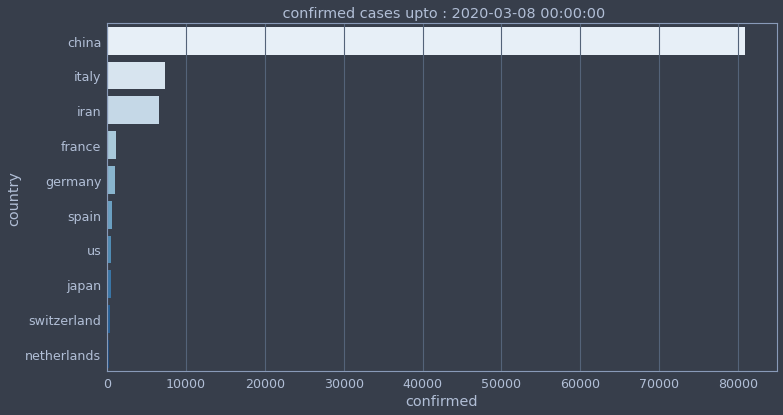

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-04-19 00:00:00', freq='6W-SUN'))


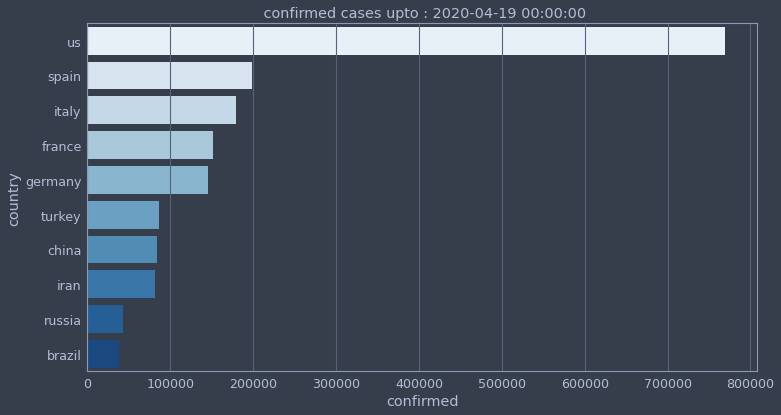

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-05-31 00:00:00', freq='6W-SUN'))


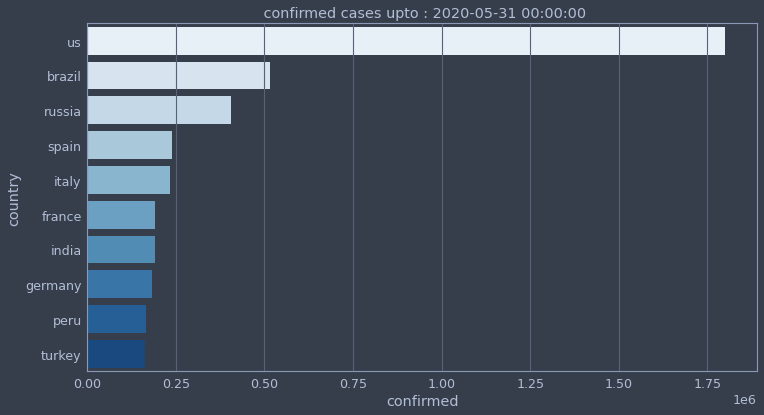

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-07-12 00:00:00', freq='6W-SUN'))


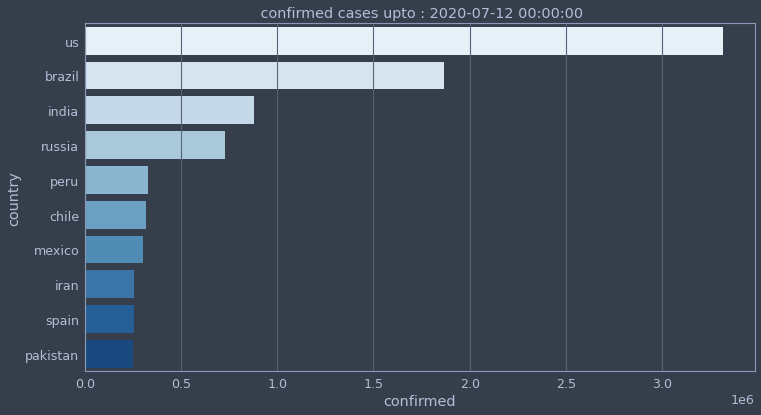

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-08-23 00:00:00', freq='6W-SUN'))


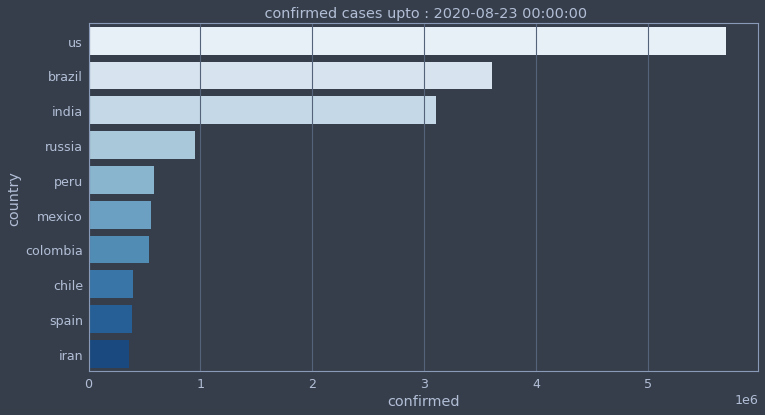

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-10-04 00:00:00', freq='6W-SUN'))


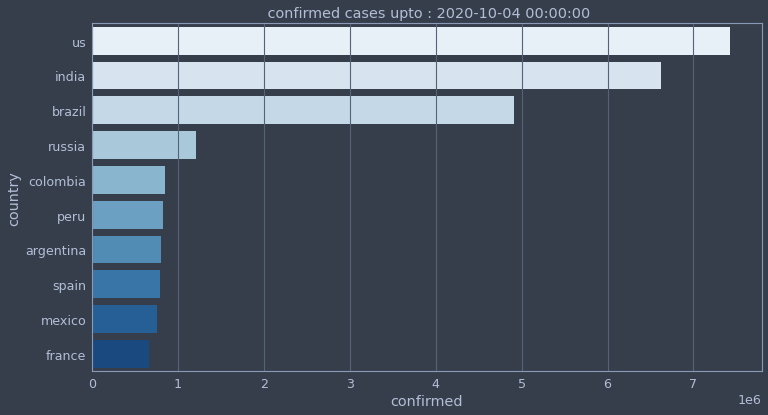

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-11-15 00:00:00', freq='6W-SUN'))


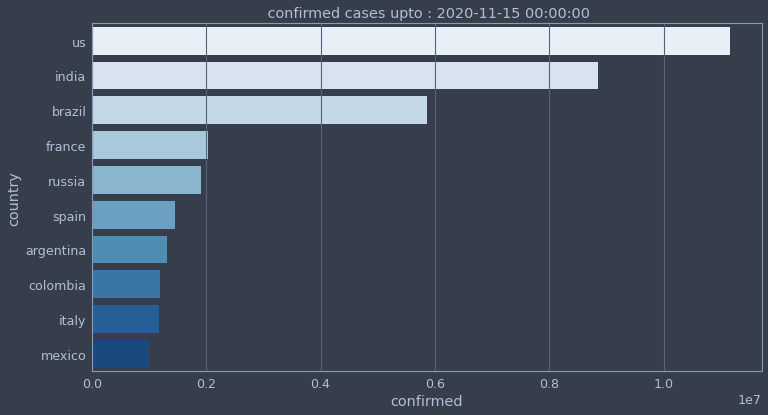

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-12-27 00:00:00', freq='6W-SUN'))


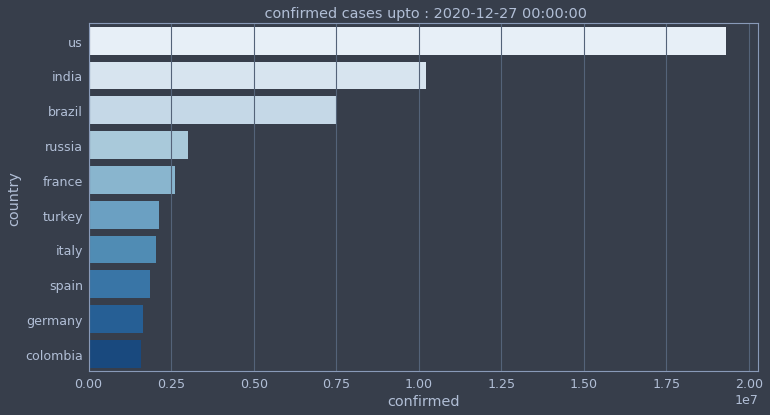

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-02-07 00:00:00', freq='6W-SUN'))


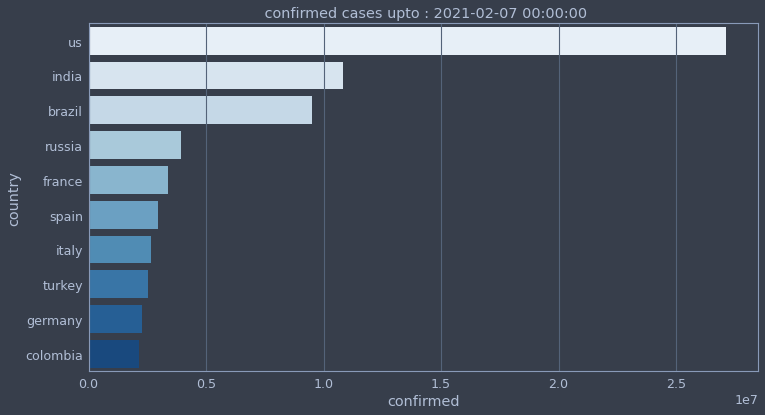

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-03-21 00:00:00', freq='6W-SUN'))


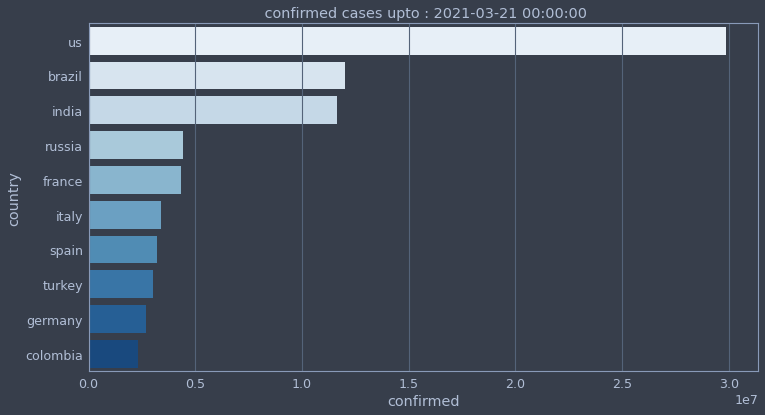

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-05-02 00:00:00', freq='6W-SUN'))


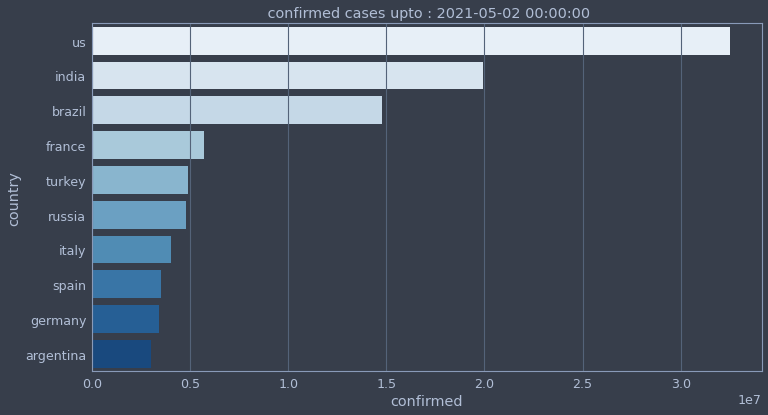

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-06-13 00:00:00', freq='6W-SUN'))


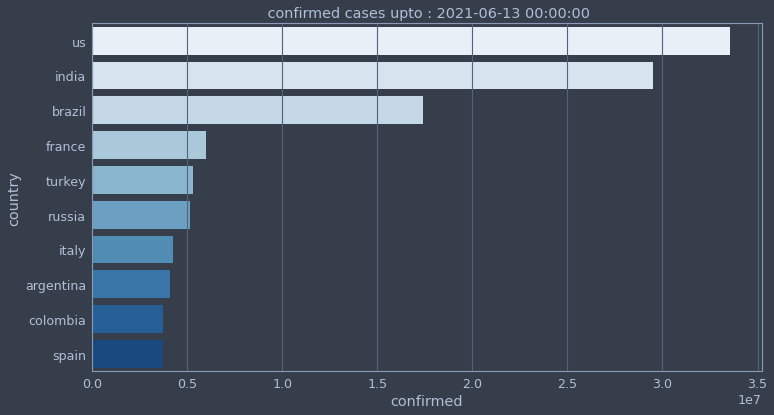

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-07-25 00:00:00', freq='6W-SUN'))


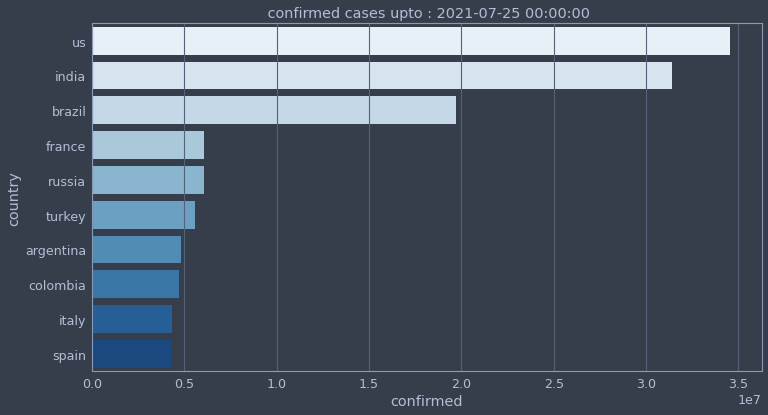

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-09-05 00:00:00', freq='6W-SUN'))


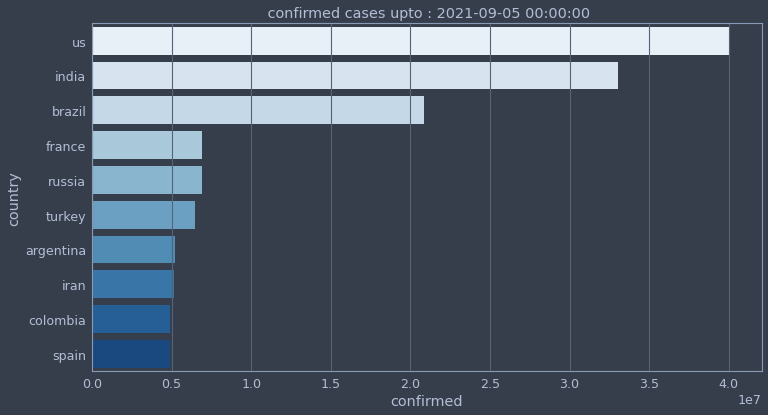

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-10-17 00:00:00', freq='6W-SUN'))


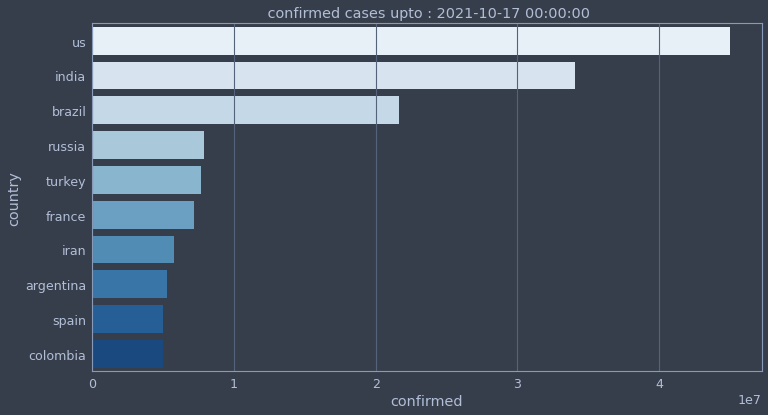

 17%|█▋        | 1/6 [00:08<00:41,  8.21s/it]

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-03-08 00:00:00', freq='6W-SUN'))


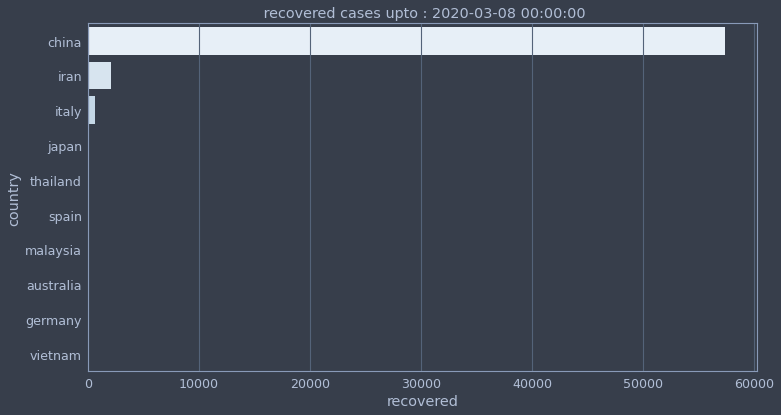

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-04-19 00:00:00', freq='6W-SUN'))


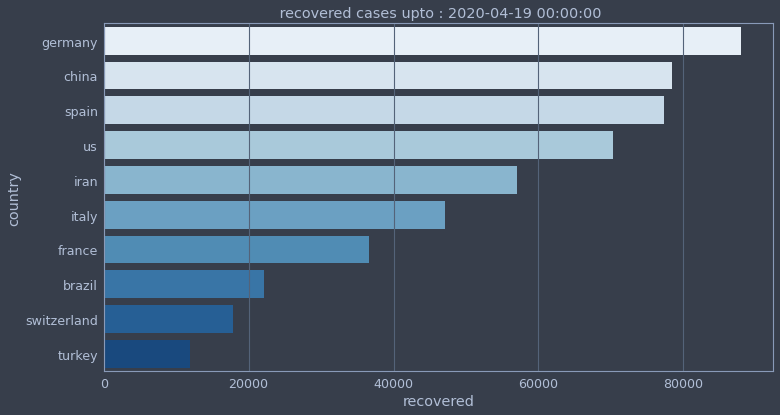

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-05-31 00:00:00', freq='6W-SUN'))


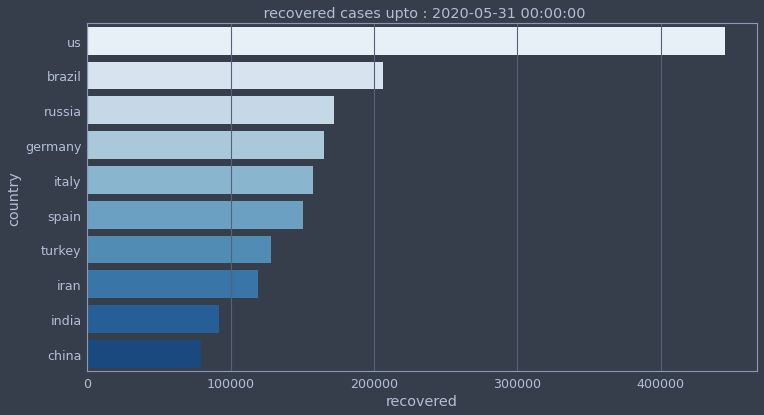

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-07-12 00:00:00', freq='6W-SUN'))


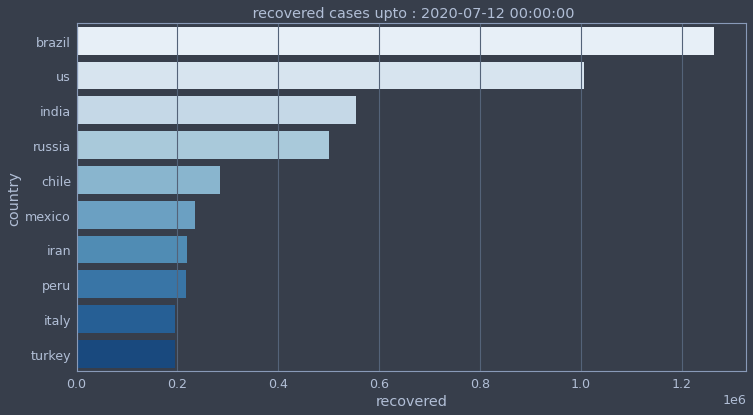

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-08-23 00:00:00', freq='6W-SUN'))


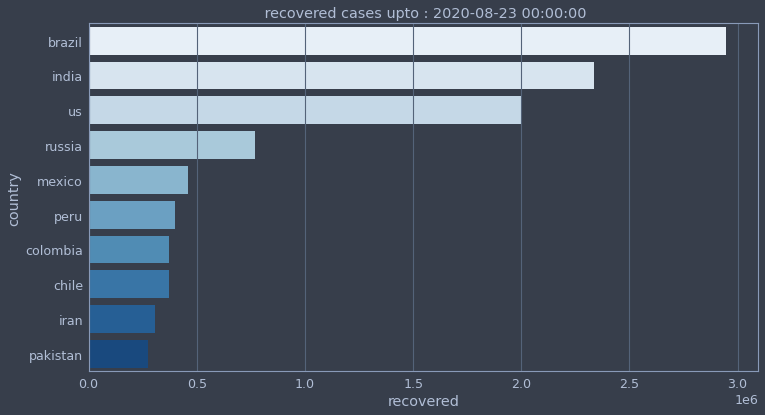

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-10-04 00:00:00', freq='6W-SUN'))


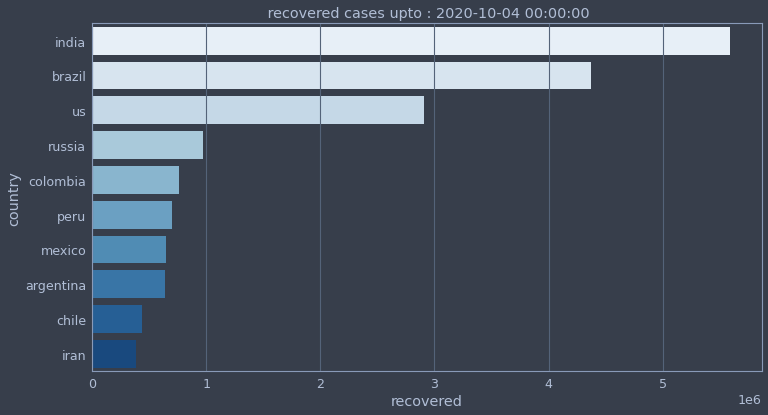

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-11-15 00:00:00', freq='6W-SUN'))


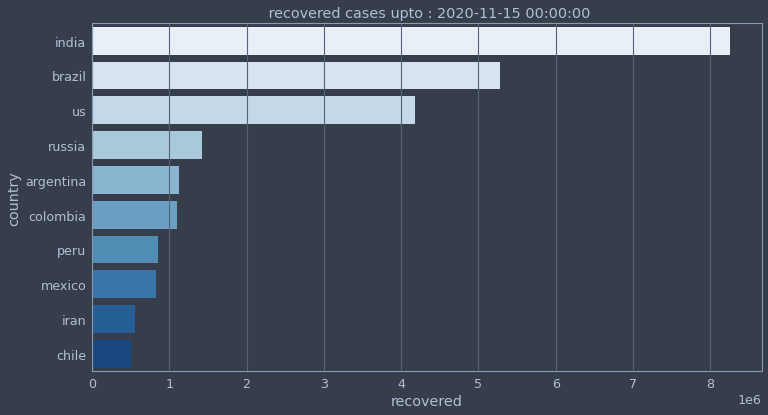

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-12-27 00:00:00', freq='6W-SUN'))


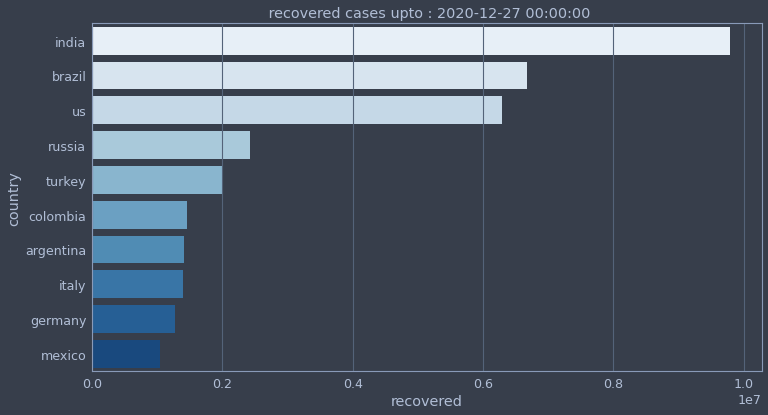

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-02-07 00:00:00', freq='6W-SUN'))


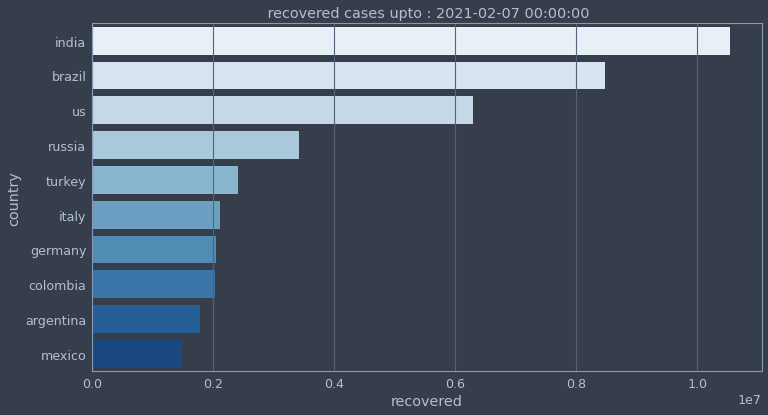

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-03-21 00:00:00', freq='6W-SUN'))


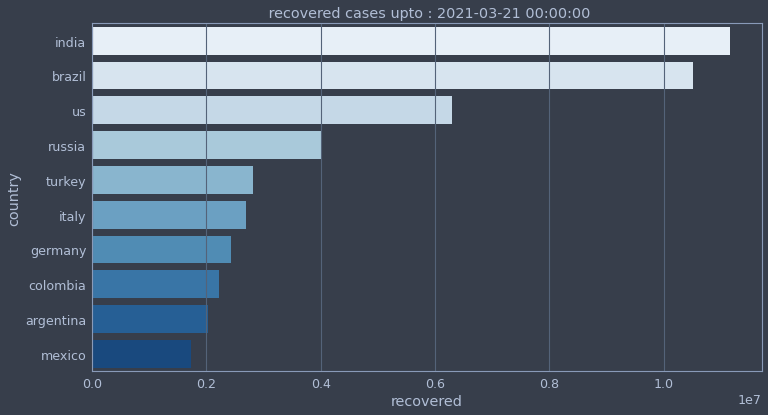

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-05-02 00:00:00', freq='6W-SUN'))


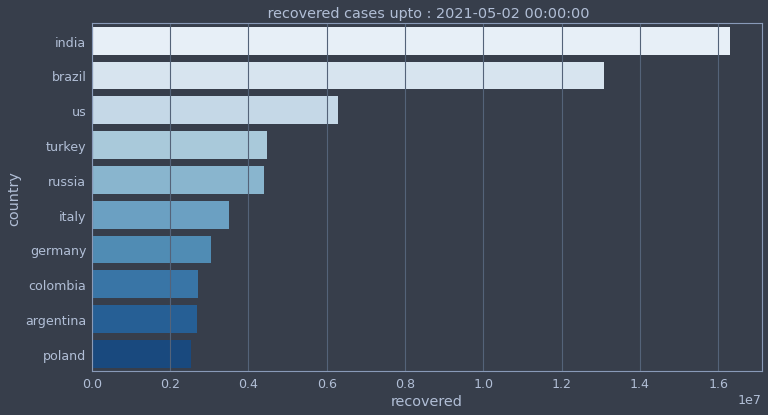

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-06-13 00:00:00', freq='6W-SUN'))


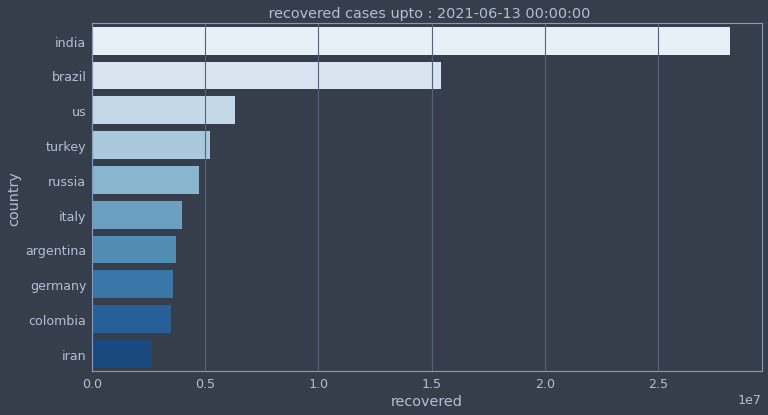

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-07-25 00:00:00', freq='6W-SUN'))


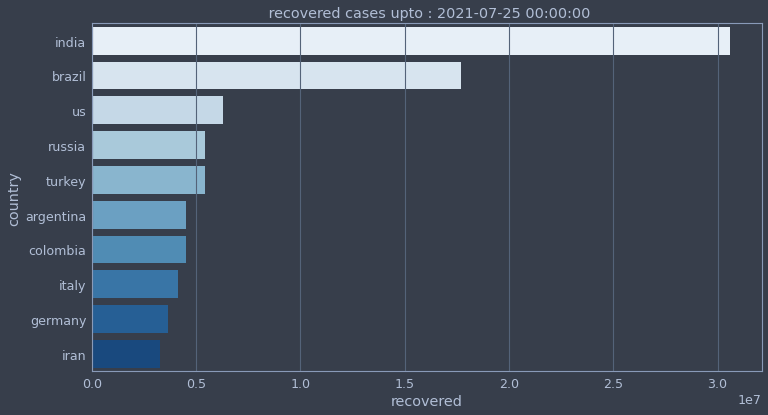

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-09-05 00:00:00', freq='6W-SUN'))


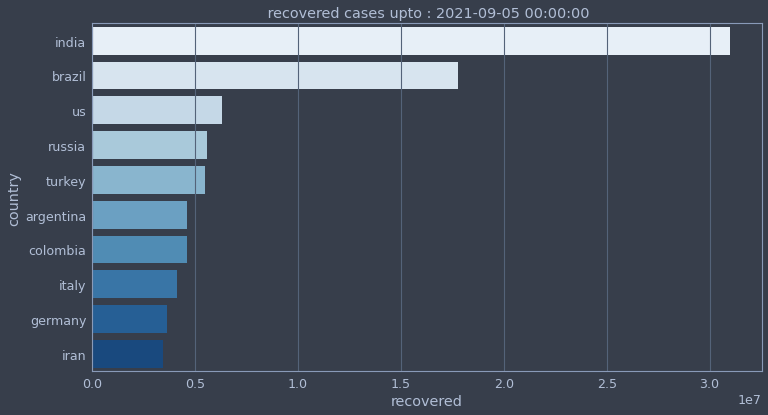

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-10-17 00:00:00', freq='6W-SUN'))


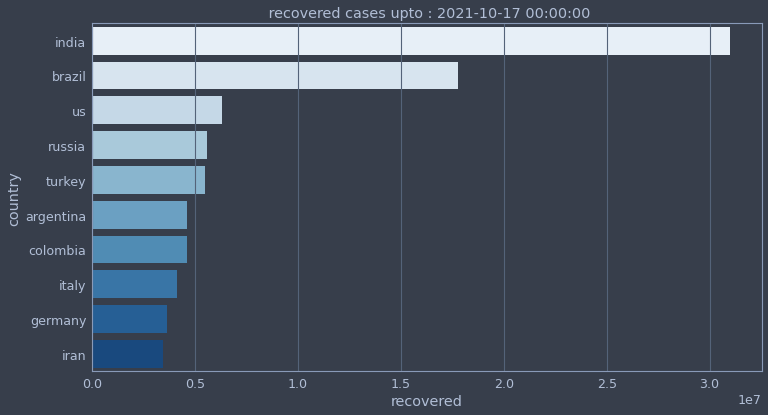

 33%|███▎      | 2/6 [00:16<00:32,  8.18s/it]

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-03-08 00:00:00', freq='6W-SUN'))


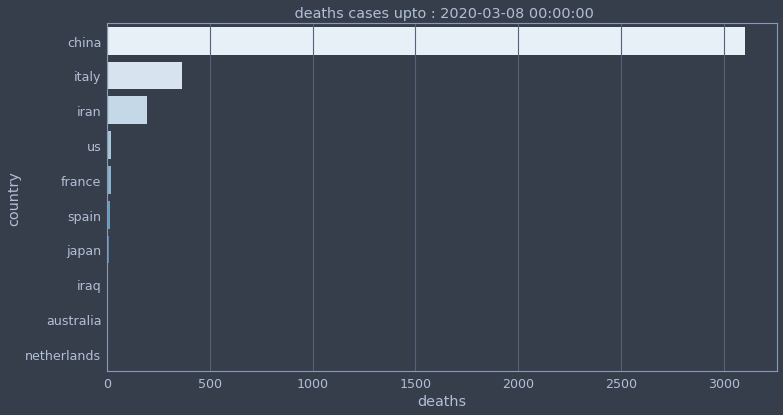

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-04-19 00:00:00', freq='6W-SUN'))


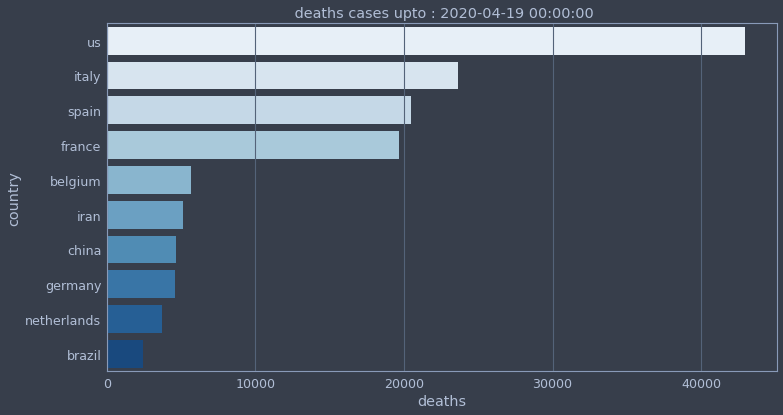

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-05-31 00:00:00', freq='6W-SUN'))


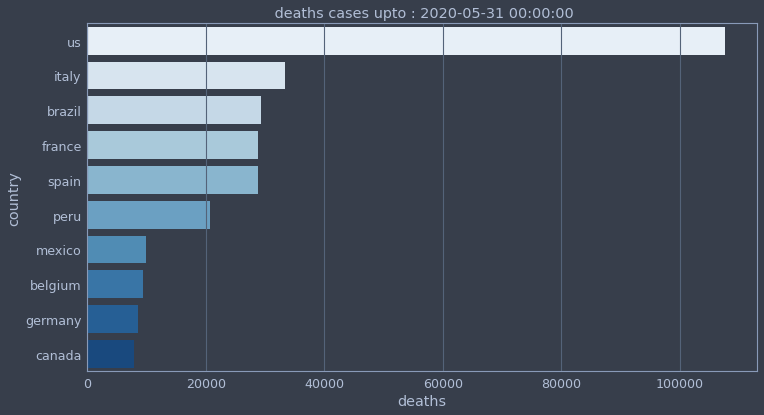

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-07-12 00:00:00', freq='6W-SUN'))


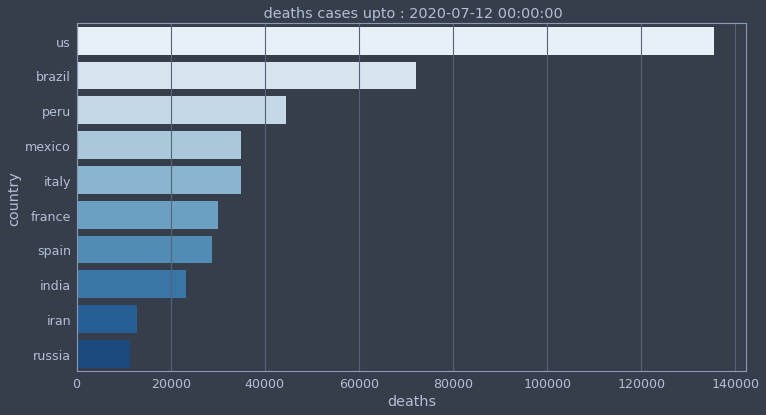

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-08-23 00:00:00', freq='6W-SUN'))


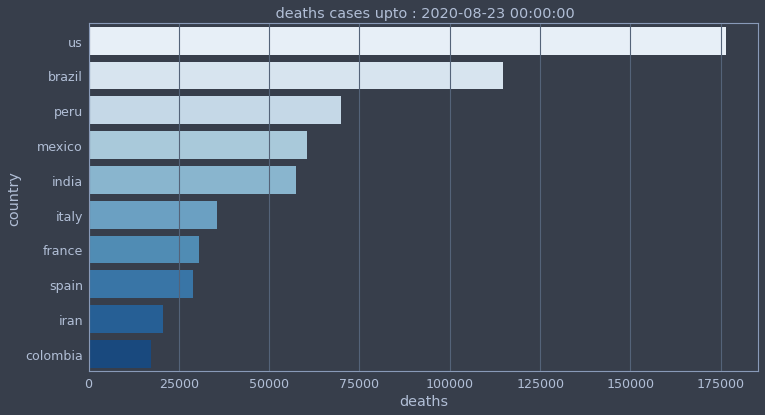

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-10-04 00:00:00', freq='6W-SUN'))


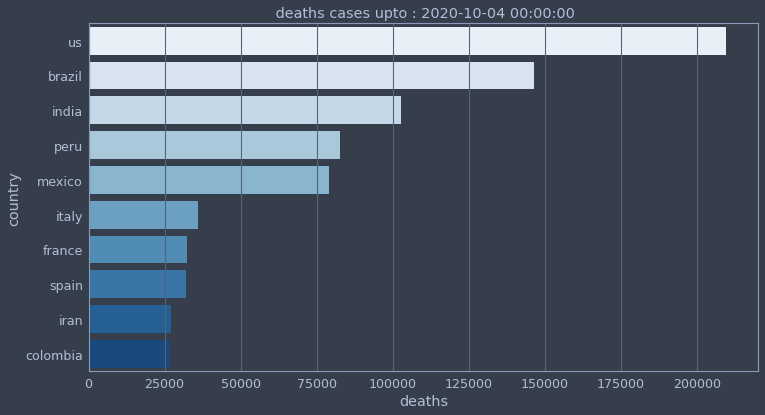

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-11-15 00:00:00', freq='6W-SUN'))


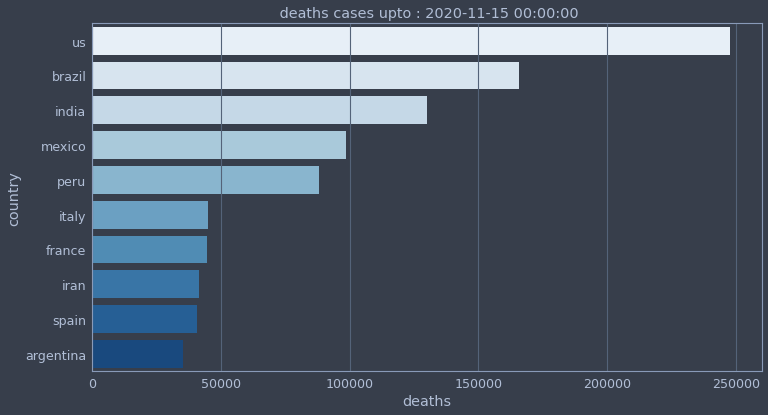

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-12-27 00:00:00', freq='6W-SUN'))


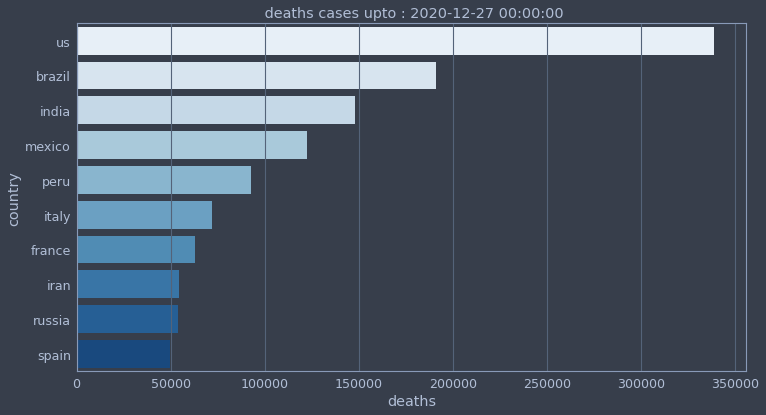

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-02-07 00:00:00', freq='6W-SUN'))


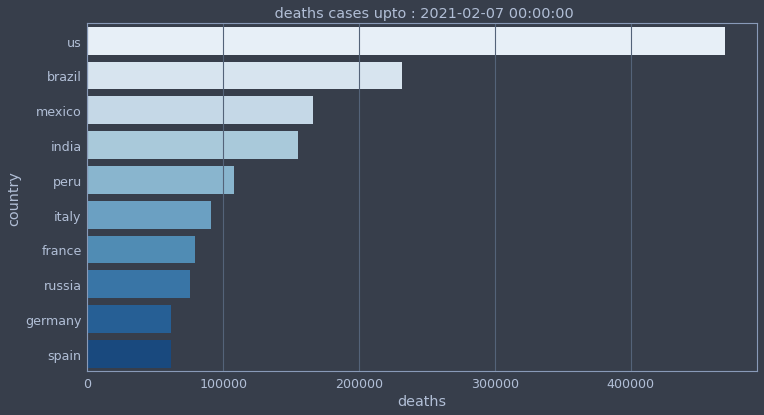

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-03-21 00:00:00', freq='6W-SUN'))


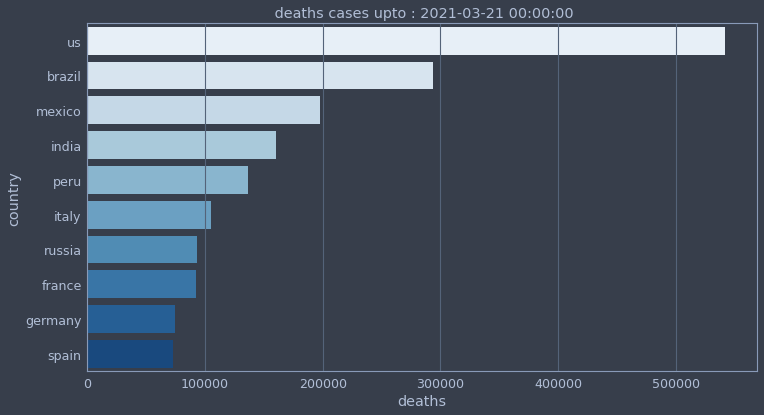

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-05-02 00:00:00', freq='6W-SUN'))


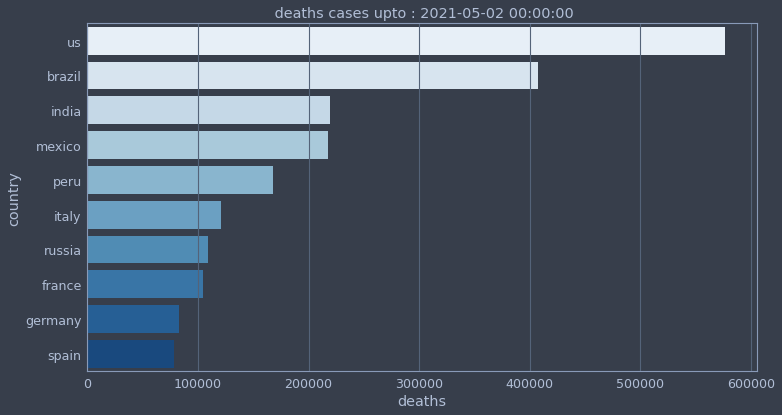

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-06-13 00:00:00', freq='6W-SUN'))


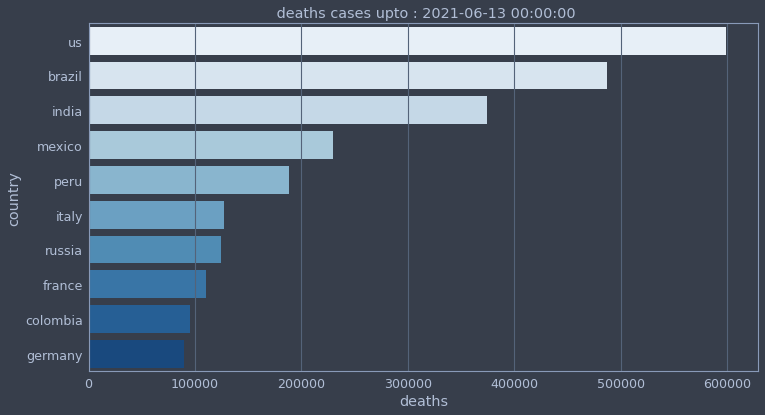

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-07-25 00:00:00', freq='6W-SUN'))


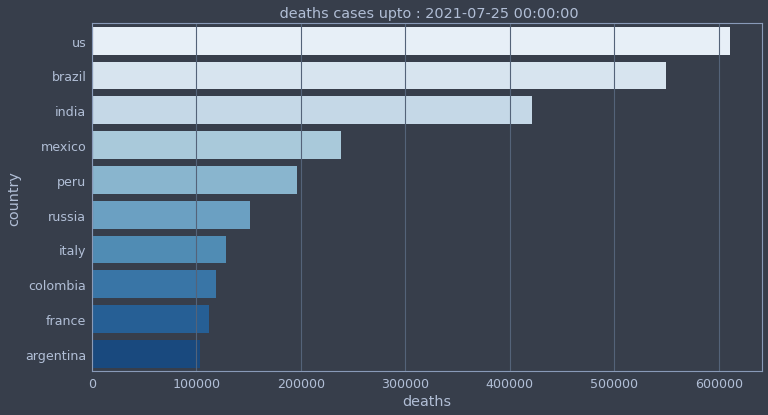

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-09-05 00:00:00', freq='6W-SUN'))


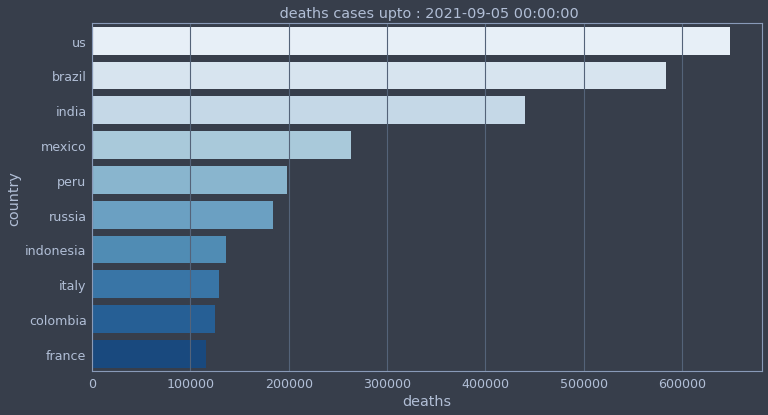

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-10-17 00:00:00', freq='6W-SUN'))


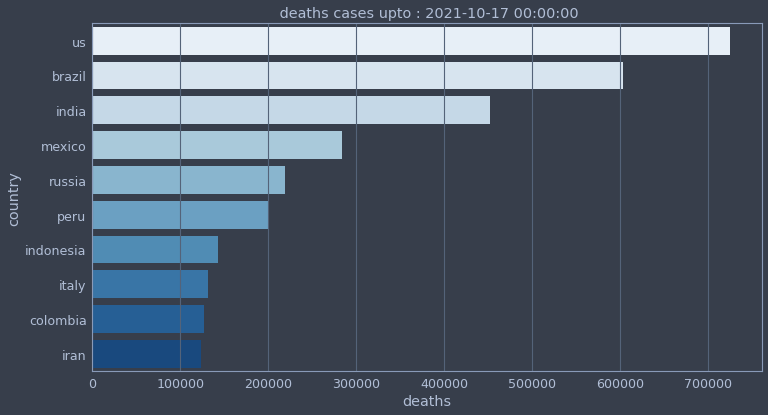

 50%|█████     | 3/6 [00:23<00:23,  7.92s/it]

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-03-08 00:00:00', freq='6W-SUN'))


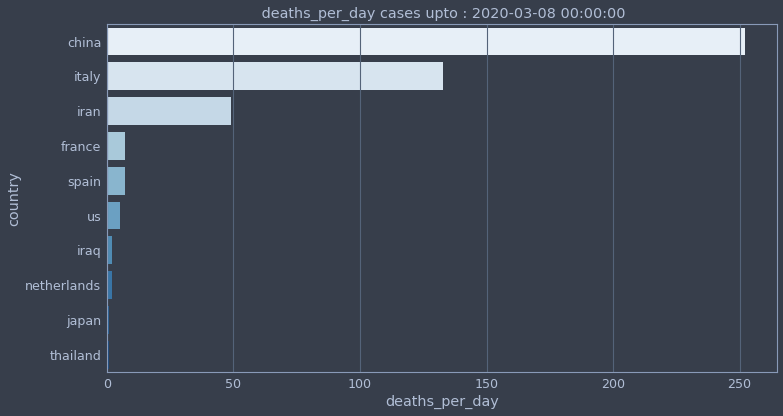

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-04-19 00:00:00', freq='6W-SUN'))


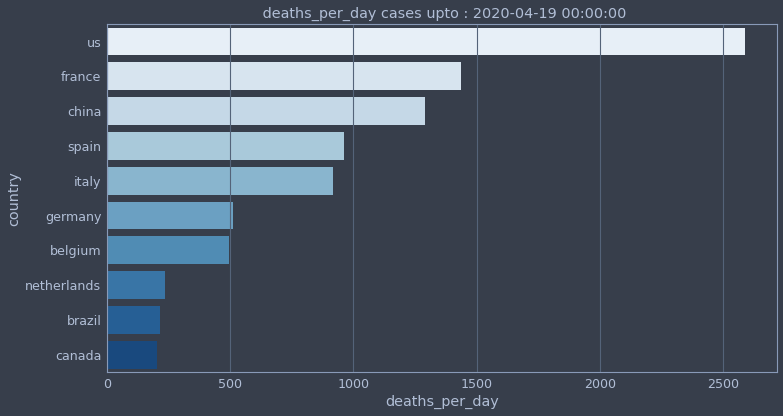

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-05-31 00:00:00', freq='6W-SUN'))


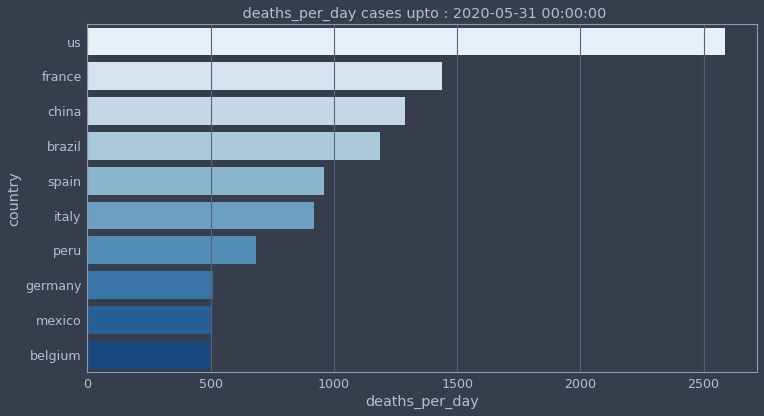

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-07-12 00:00:00', freq='6W-SUN'))


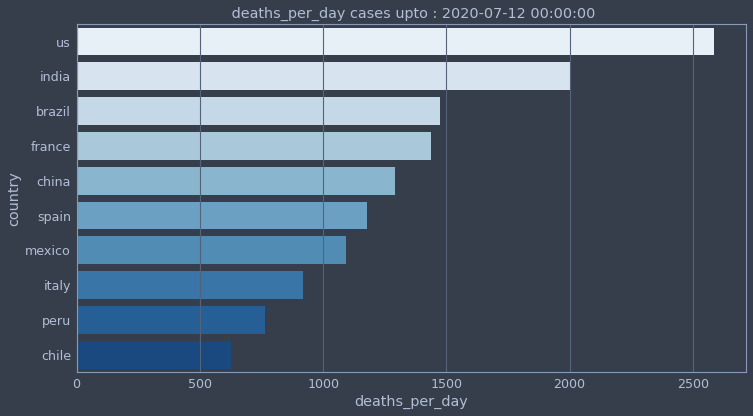

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-08-23 00:00:00', freq='6W-SUN'))


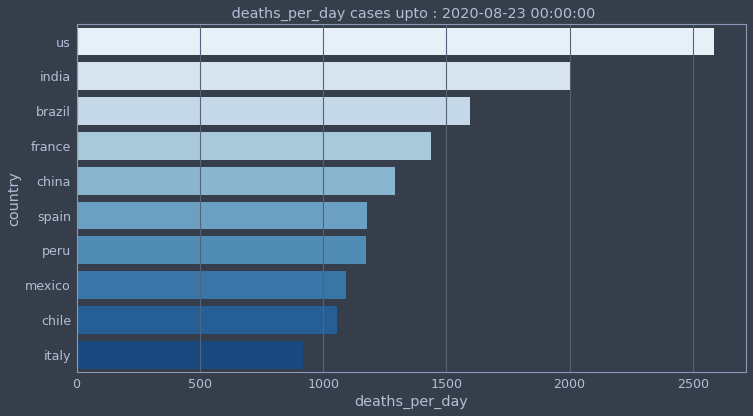

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-10-04 00:00:00', freq='6W-SUN'))


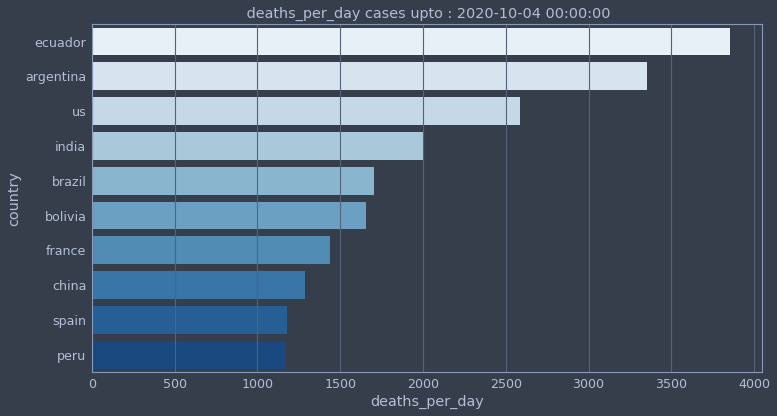

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-11-15 00:00:00', freq='6W-SUN'))


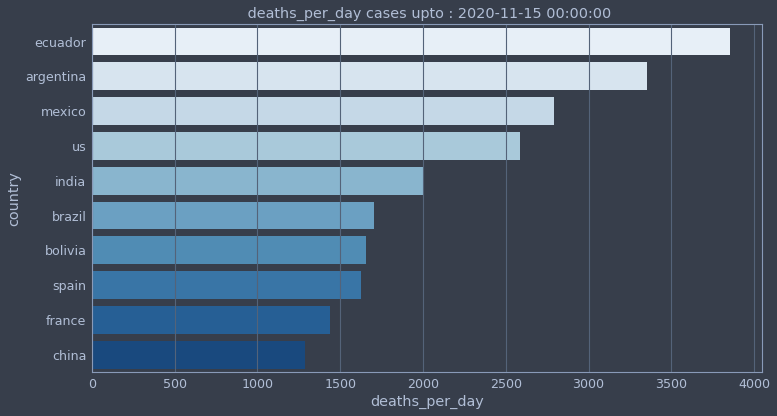

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-12-27 00:00:00', freq='6W-SUN'))


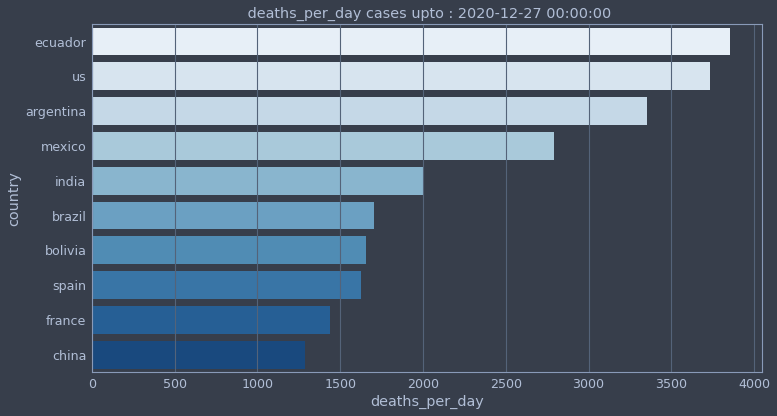

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-02-07 00:00:00', freq='6W-SUN'))


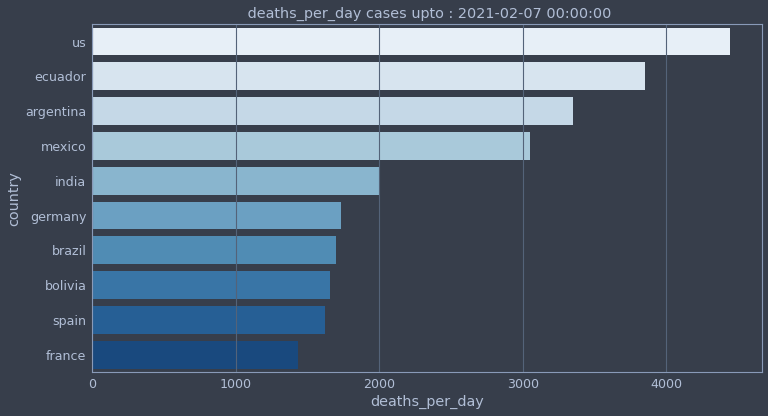

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-03-21 00:00:00', freq='6W-SUN'))


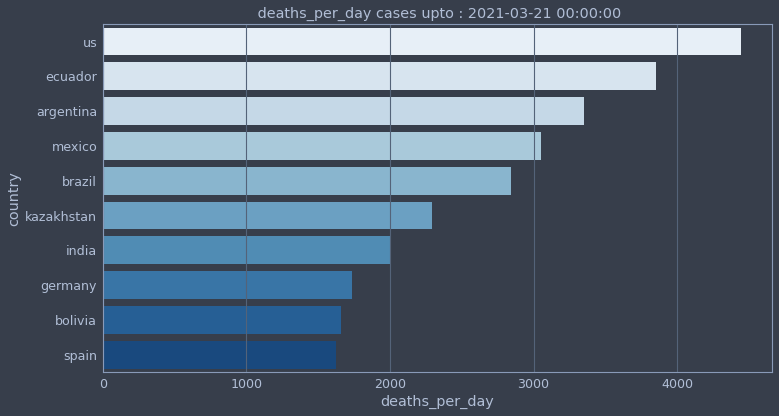

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-05-02 00:00:00', freq='6W-SUN'))


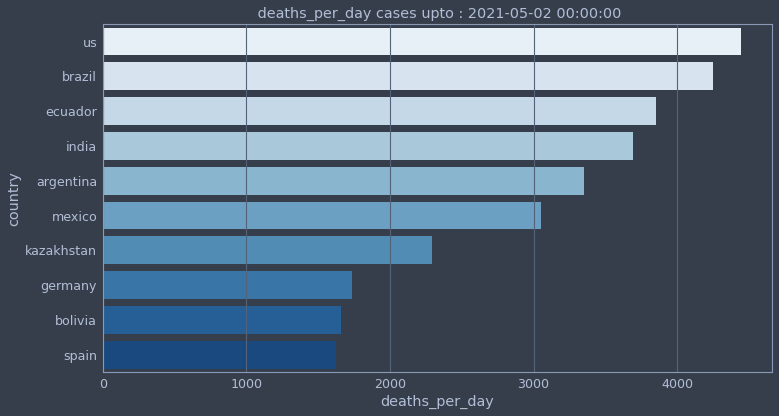

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-06-13 00:00:00', freq='6W-SUN'))


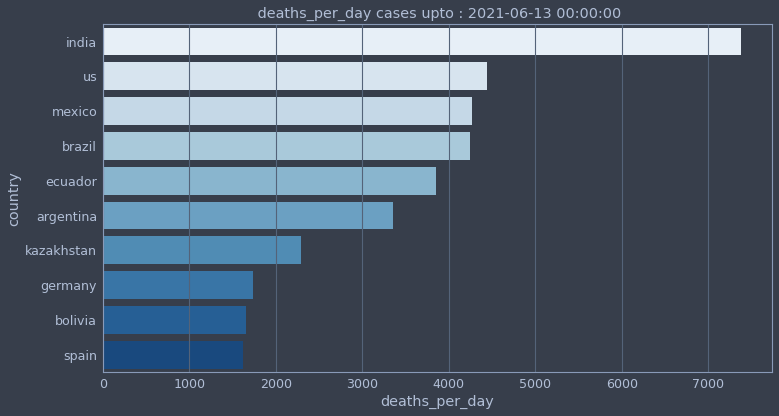

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-07-25 00:00:00', freq='6W-SUN'))


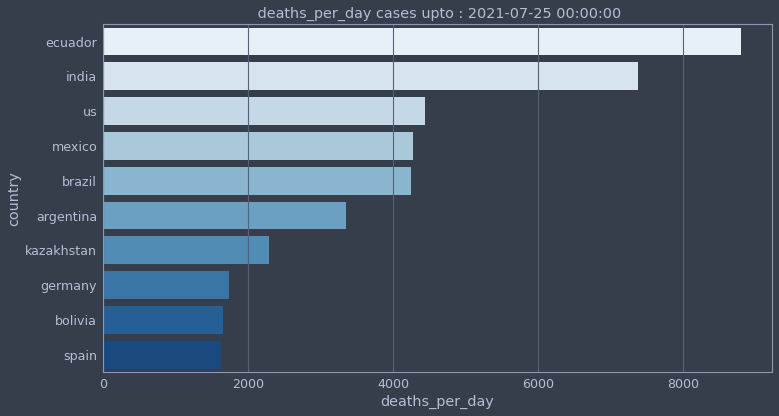

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-09-05 00:00:00', freq='6W-SUN'))


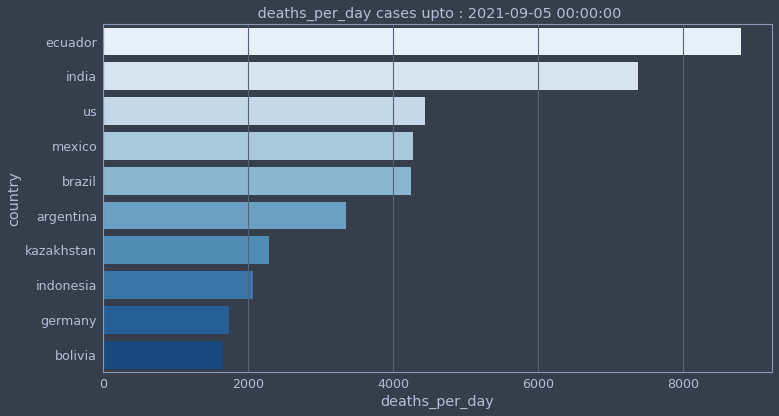

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-10-17 00:00:00', freq='6W-SUN'))


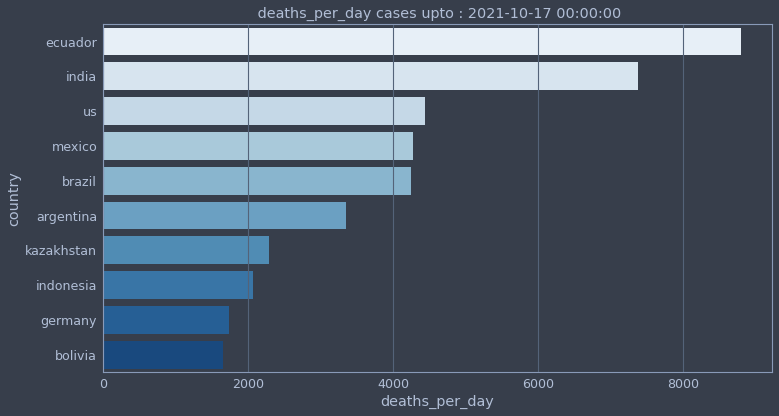

 67%|██████▋   | 4/6 [00:32<00:15,  7.97s/it]

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-03-08 00:00:00', freq='6W-SUN'))


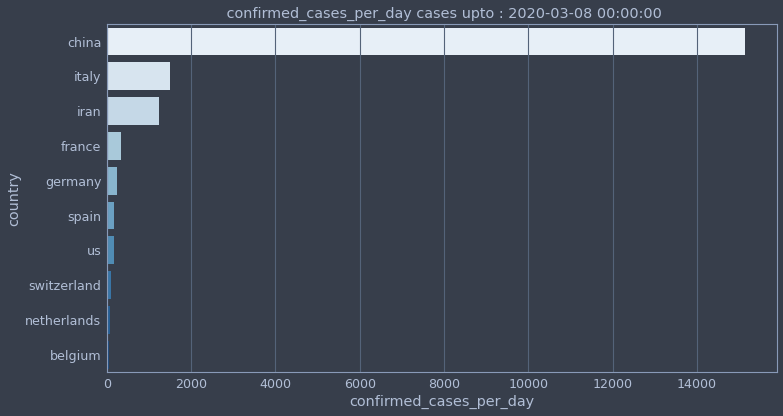

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-04-19 00:00:00', freq='6W-SUN'))


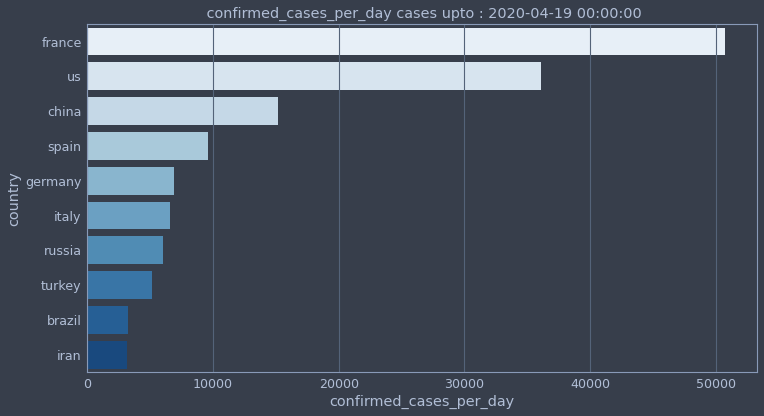

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-05-31 00:00:00', freq='6W-SUN'))


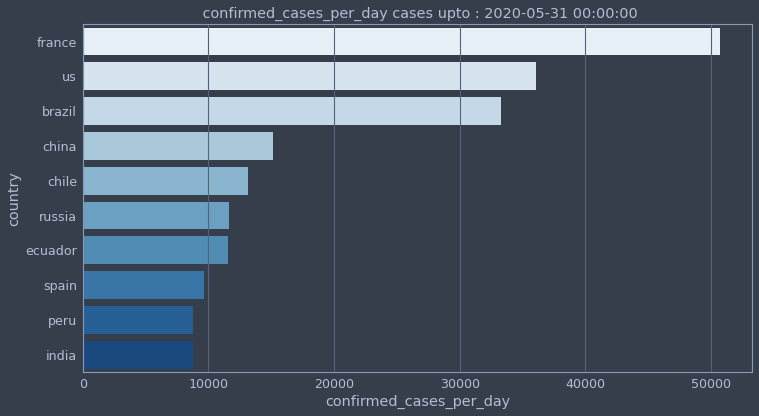

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-07-12 00:00:00', freq='6W-SUN'))


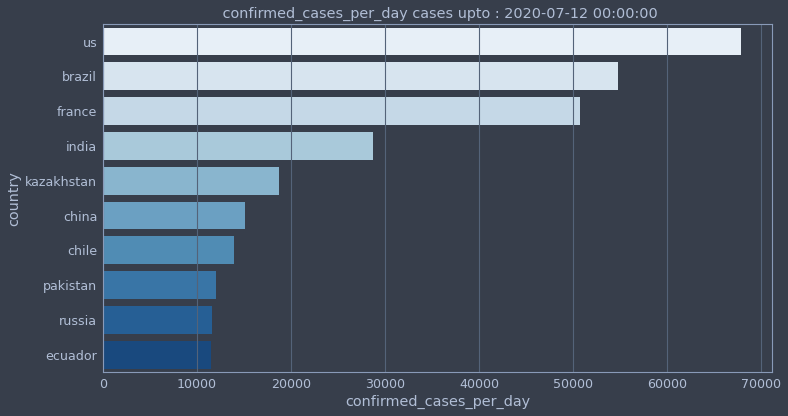

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-08-23 00:00:00', freq='6W-SUN'))


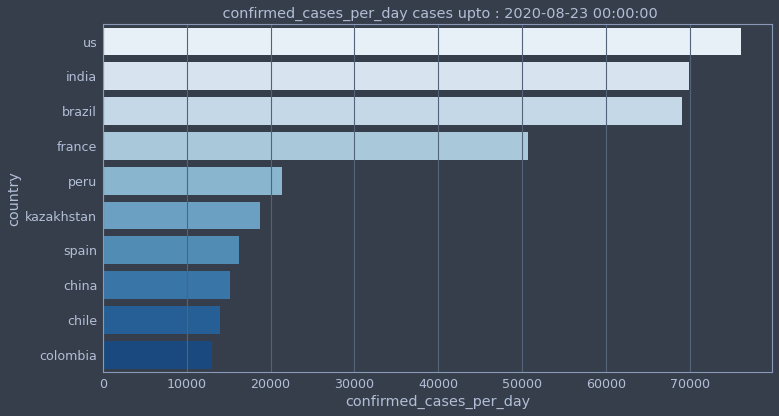

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-10-04 00:00:00', freq='6W-SUN'))


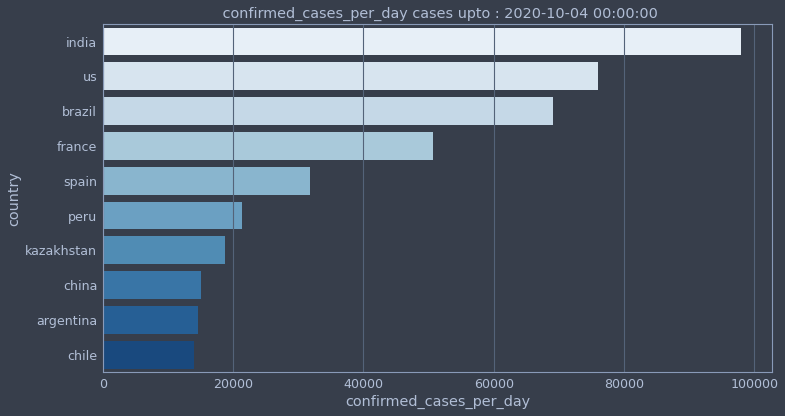

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-11-15 00:00:00', freq='6W-SUN'))


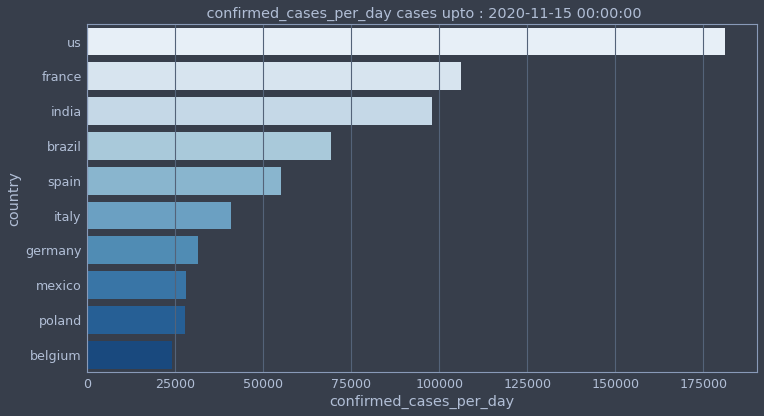

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-12-27 00:00:00', freq='6W-SUN'))


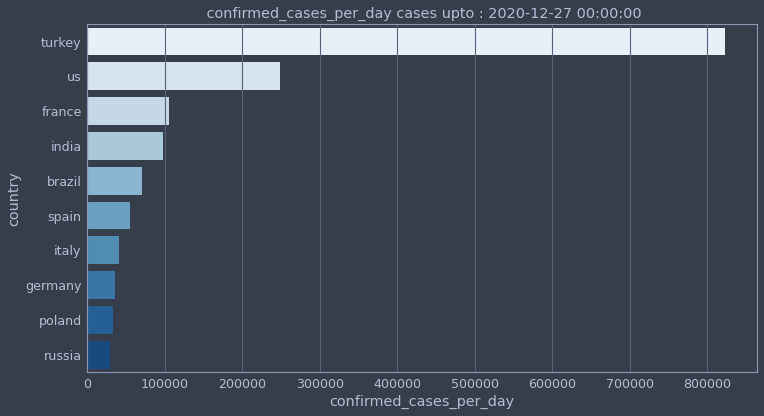

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-02-07 00:00:00', freq='6W-SUN'))


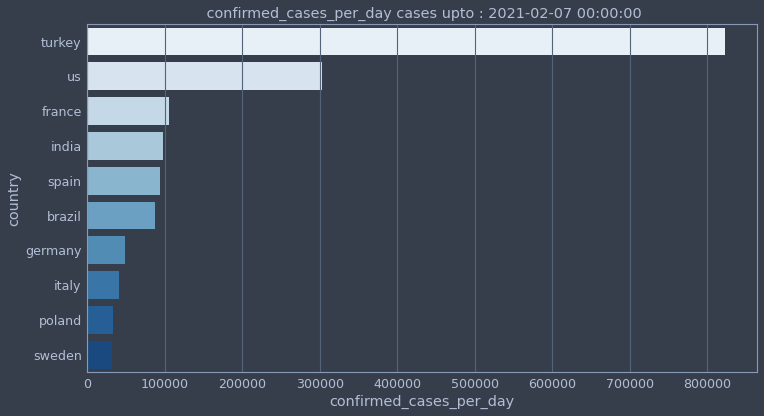

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-03-21 00:00:00', freq='6W-SUN'))


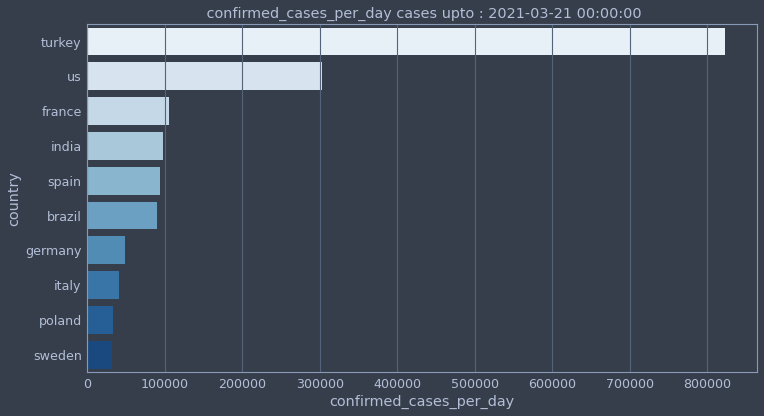

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-05-02 00:00:00', freq='6W-SUN'))


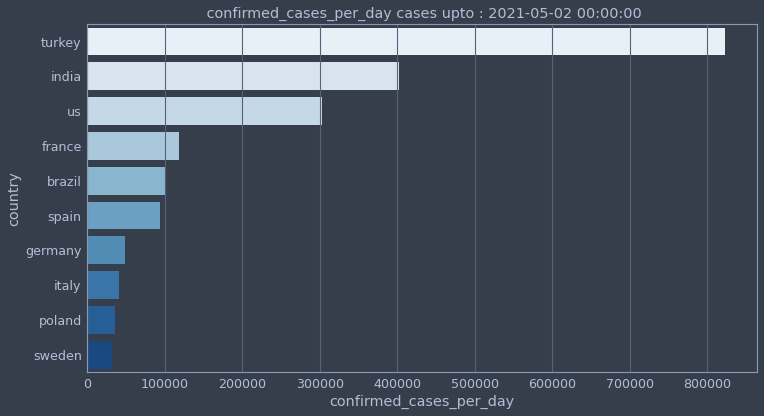

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-06-13 00:00:00', freq='6W-SUN'))


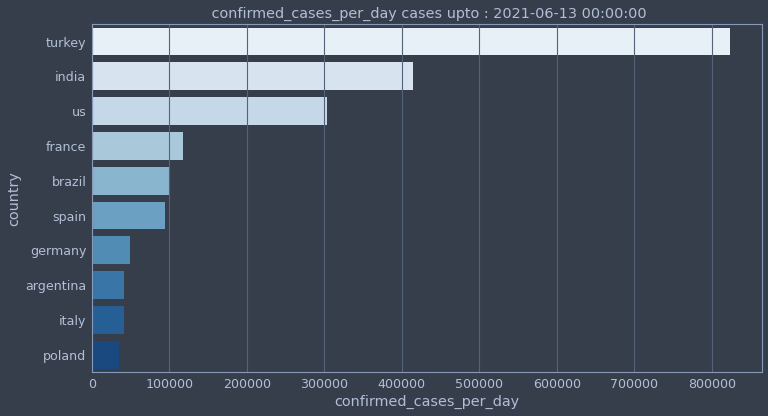

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-07-25 00:00:00', freq='6W-SUN'))


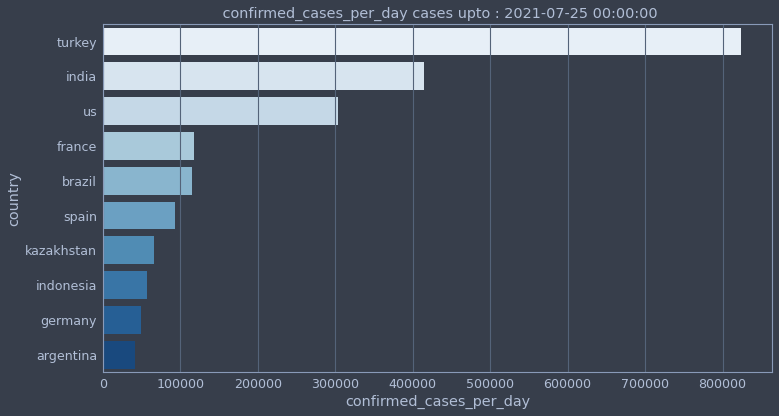

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-09-05 00:00:00', freq='6W-SUN'))


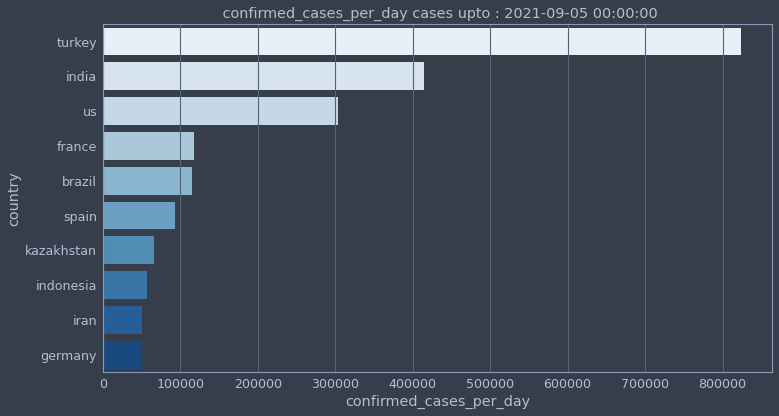

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-10-17 00:00:00', freq='6W-SUN'))


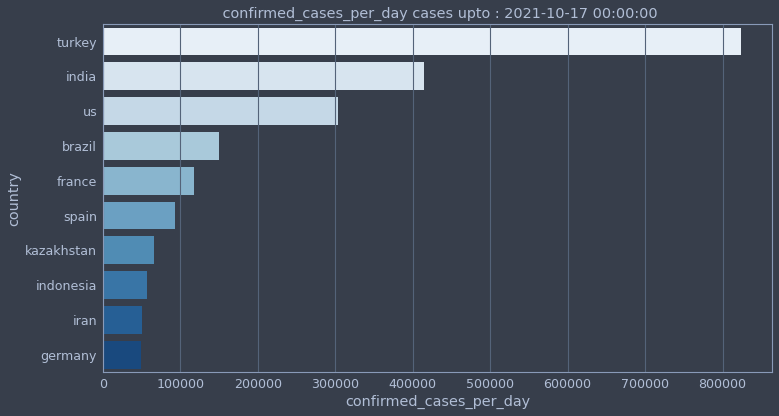

 83%|████████▎ | 5/6 [00:40<00:08,  8.08s/it]

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-03-08 00:00:00', freq='6W-SUN'))


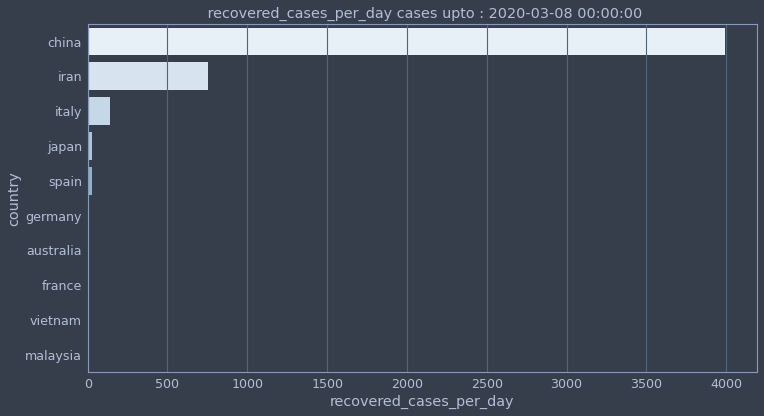

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-04-19 00:00:00', freq='6W-SUN'))


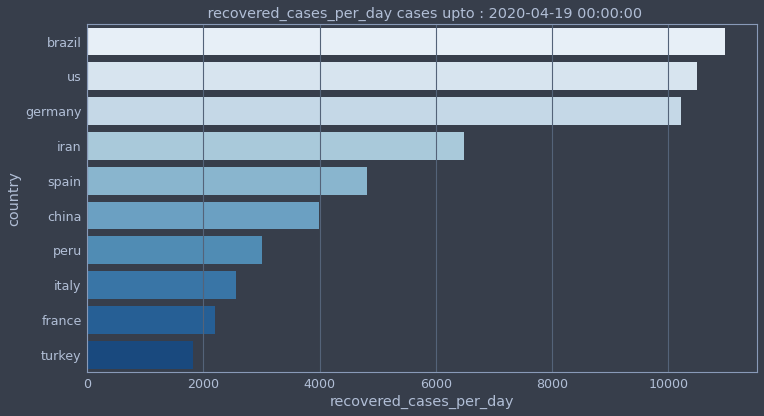

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-05-31 00:00:00', freq='6W-SUN'))


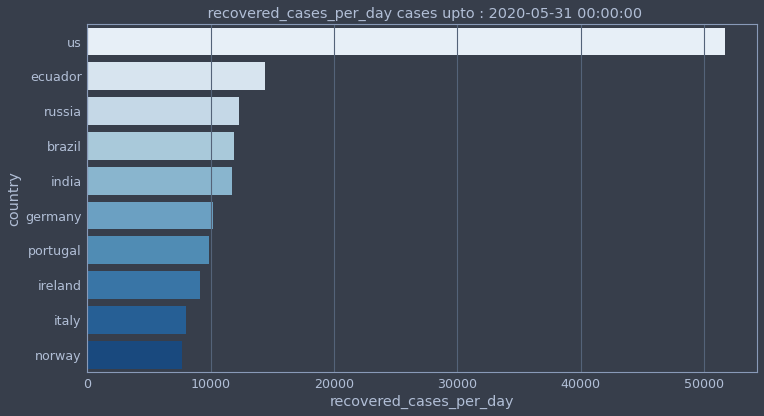

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-07-12 00:00:00', freq='6W-SUN'))


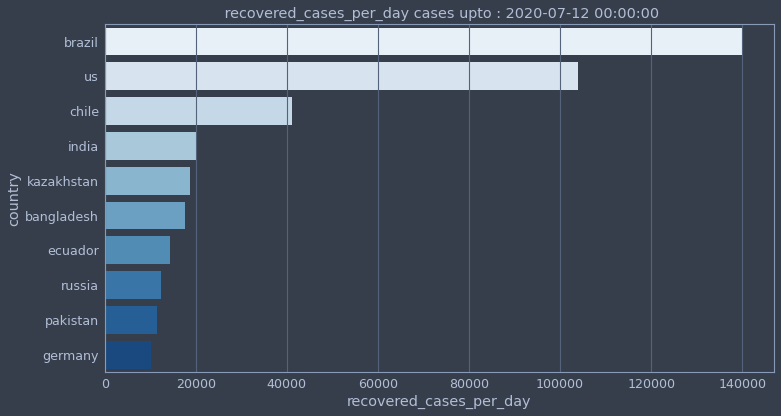

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-08-23 00:00:00', freq='6W-SUN'))


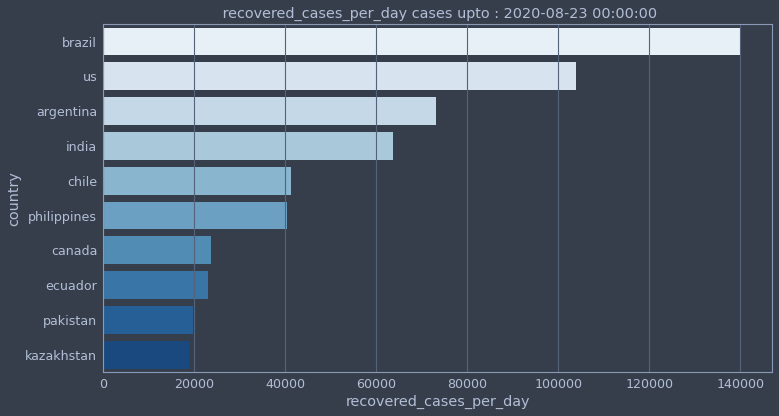

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-10-04 00:00:00', freq='6W-SUN'))


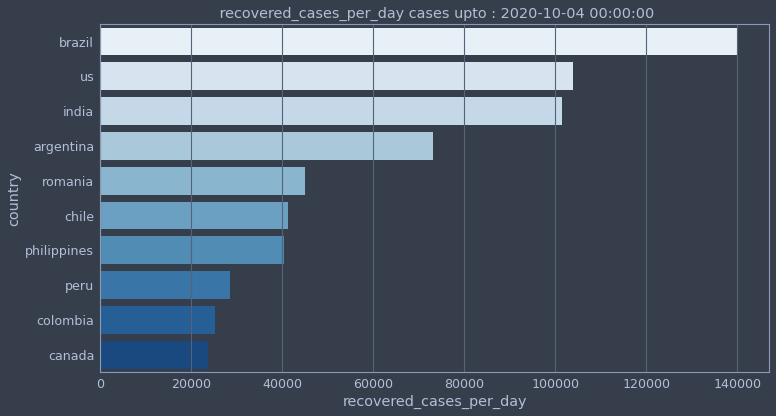

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-11-15 00:00:00', freq='6W-SUN'))


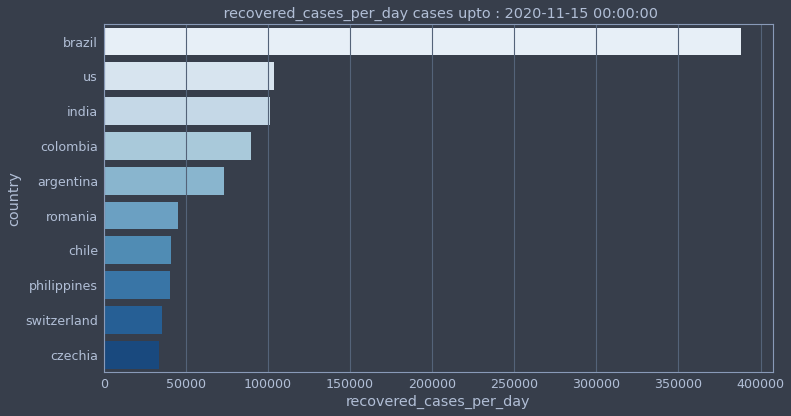

(Timestamp('2020-01-23 00:00:00'), Timestamp('2020-12-27 00:00:00', freq='6W-SUN'))


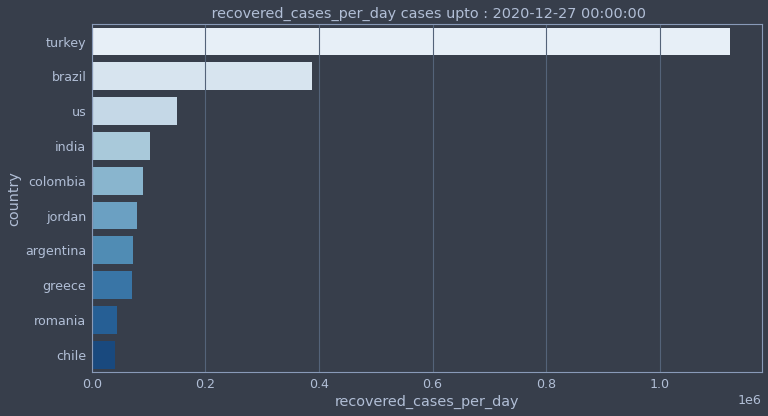

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-02-07 00:00:00', freq='6W-SUN'))


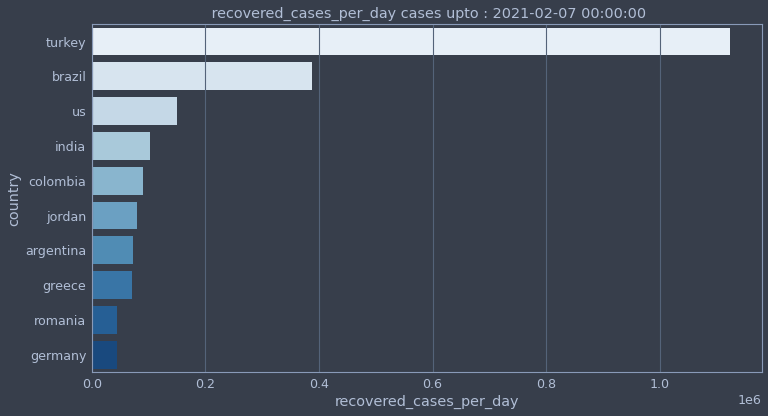

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-03-21 00:00:00', freq='6W-SUN'))


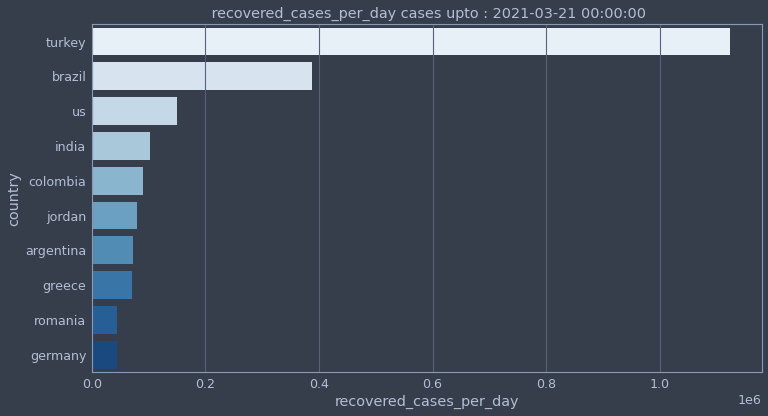

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-05-02 00:00:00', freq='6W-SUN'))


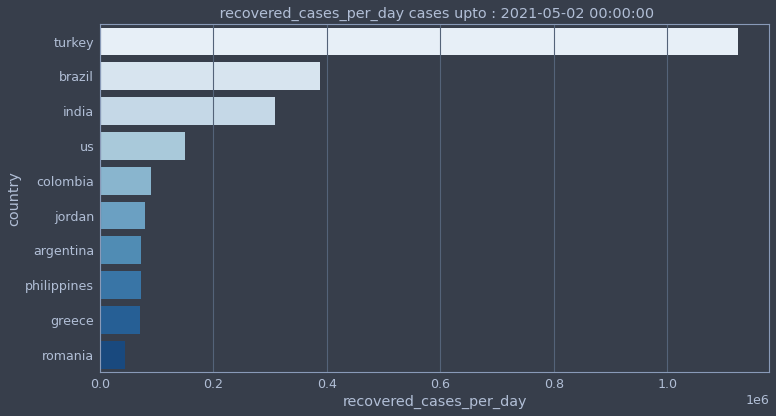

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-06-13 00:00:00', freq='6W-SUN'))


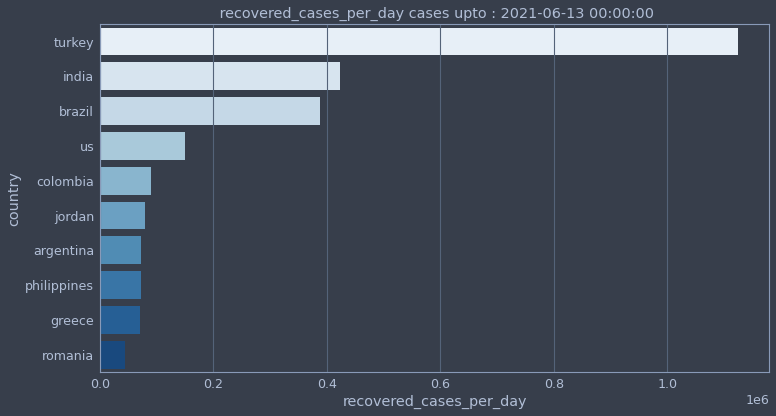

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-07-25 00:00:00', freq='6W-SUN'))


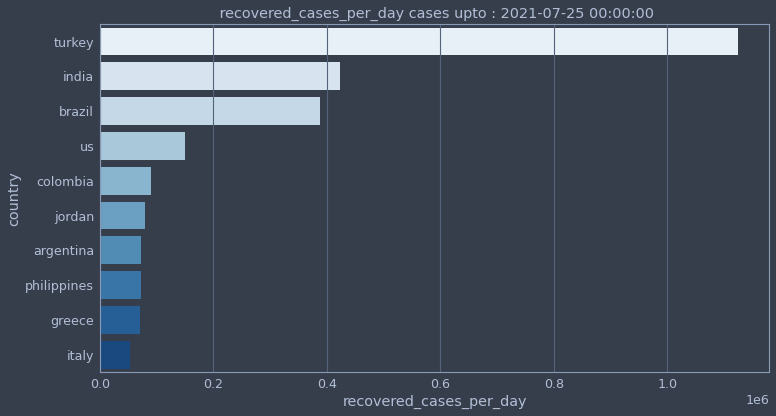

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-09-05 00:00:00', freq='6W-SUN'))


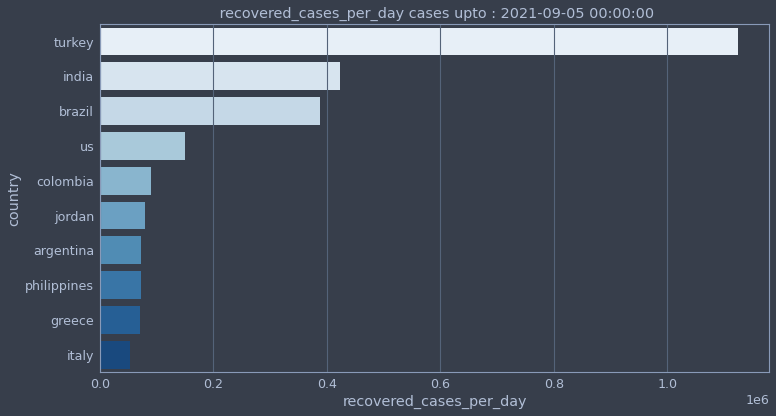

(Timestamp('2020-01-23 00:00:00'), Timestamp('2021-10-17 00:00:00', freq='6W-SUN'))


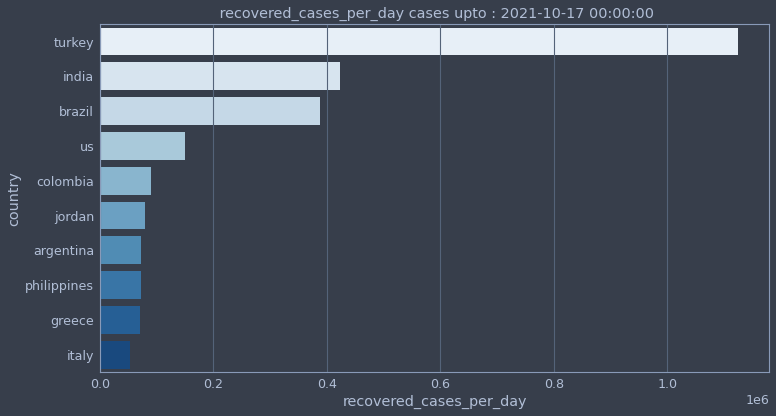

100%|██████████| 6/6 [00:48<00:00,  8.04s/it]


In [48]:

import pandas
import cv2
from datetime import date, timedelta
base_path = '/content/drive/MyDrive/AdvancedPython/3/6W'
sdate = min(joined_df['datetime'])

for cat in tqdm(category):
  
  video_name = base_path+cat+'.avi'
  frame = cv2.imread('output.png')
  height, width, layers = frame.shape
  video = cv2.VideoWriter(video_name, 0, 10, (width,height),)
  date_range = pandas.date_range(min(joined_df['datetime']), max(joined_df['datetime']),freq='6W')
  plots = []
  for i, date in enumerate(date_range[1:]):
    plot_data_range2( date_range=(sdate, date), category=cat, save = True, i=i)
    #plot.savefig('output.png')
    video.write(cv2.imread('output.png'))
  cv2.destroyAllWindows()
  video.release()
  

<a name='t'></a>
## Pick a country to see its trend

In [ ]:
#jtplot.style( figsize=(15, 8), theme = 'onedork')
matplotlib.rcParams['figure.figsize'] = [20, 8]
matplotlib.rcParams['axes.labelsize'] = 20
matplotlib.rcParams['xtick.labelsize'] = 17
matplotlib.rcParams['ytick.labelsize'] = 17
countries = joined_df.country.unique()
case_type  = ['confirmed', 'recovered'
       , 'deaths',   'deaths_per_day', 'confirmed_cases_per_day',
       'recovered_cases_per_day']
i = 0
def plot_data_range(countries,case_type):
    
    #print(date_range)
    filtered_df = joined_df[joined_df['country']== countries]
    #len(filtered_df)
    #filetered_df = filtered_df.sort_values('deaths',ascending=False).reset_index()
    filtered_df = filtered_df.dropna(subset=[case_type],inplace=False)
    plt.plot(filtered_df['datetime'],filtered_df[case_type])
    plt.ylabel(f'Frequency of {case_type} cases ')
    plt.xlabel('Time')
    plt.title(f'Covid Cases Trend')
widgets.interact(
    plot_data_range,
    case_type = case_type,
    countries = countries,
    
    
);

interactive(children=(Dropdown(description='countries', options=('afghanistan', 'albania', 'algeria', 'angola'…